#### Import library and processing data (.mat and shapefile)

In [184]:
import scipy.io
import pandas as pd
import numpy as np
import os
import glob
import geopandas as gpd
from shapely.geometry import shape
import matplotlib.pyplot as plt
import xarray as xr
from statsmodels.tsa.seasonal import STL
from statsmodels.tsa.seasonal import seasonal_decompose
from scipy.stats import zscore
from scipy.stats import linregress
import scipy.stats as stats
from scipy.stats import norm
from sklearn.neighbors import KernelDensity

# Define metadata for the time series variables
var_list_lsm  = [
    ("TWS_tavg", "terrestrial water storage", "mm"),
    ("Swnet_tavg", "net downward shortwave radiation", "W m-2"),
    ("Lwnet_tavg", "net downward longwave radiation", "W m-2"),
    ("Qle_tavg", "latent heat flux", "W m-2"),
    ("Qh_tavg", "sensible heat flux", "W m-2"),
    ("Qg_tavg", "soil heat flux", "W m-2"),
    ("EF_tavg", "evaporative fraction", "-"),
    ("Evap_tavg", "total evapotranspiration", "kg m-2 s-1"),
    ("Qs_tavg", "surface runoff", "kg m-2 s-1"),
    ("Qsb_tavg", "subsurface runoff", "kg m-2 s-1"),
    ("AvgSurfT_tavg", "surface temperature", "K"),
    ("SoilMoist01_tavg", "soil moisture content 0-10 cm", "m3 m-3"),
    ("SoilMoist02_tavg", "soil moisture content 10-40 cm", "m3 m-3"),
    ("SoilMoist03_tavg", "soil moisture content 40-100 cm", "m3 m-3"),
    ("SoilMoist04_tavg", "soil moisture content 100-200 cm", "m3 m-3"),
    ("SoilTemp01_tavg", "soil temperature 0-10 cm", "K"),
    ("SoilTemp02_tavg", "soil temperature 10-40 cm", "K"),
    ("SoilTemp03_tavg", "soil temperature 40-100 cm", "K"),
    ("SoilTemp04_tavg", "soil temperature 100-200 cm", "K"),
    ("TVeg_tavg", "vegetation transpiration", "kg m-2 s-1"),
    ("ESoil_tavg", "bare soil evaporation", "kg m-2 s-1"),
    ("WaterTableD_inst", "water table depth", "m"),
    ("GWS_tavg", "ground water storage", "mm"),
    ("GPP_tavg", "gross primary production", "g m-2 s-1"),
    ("NPP_tavg", "net primary productivity", "g m-2 s-1"),
    ("NEE_tavg", "net ecosystem exchange", "g m-2 s-1"),
    ("Rainf_f_tavg", "rainfall flux", "kg m-2 s-1"),
    ("Tair_f_tavg", "air temperature", "K"),
    ("LAI_tavg", "leaf area index", "m2 m-2"),
]

directory_path = r"D:\Dom_Work\A_Work\Work\01_AIT\02_Environmental Indice\time_series_province\prov"

# Use glob to find all .mat files in the directory
mat_files = glob.glob(os.path.join(directory_path, "*.mat"))

# Initialize lists to store data
all_time_series = []
all_dates = []
all_basin_names = []
file_names = []

# Loop through each .mat file
for mat_file in mat_files:
    try:
        # Load the .mat file
        data = scipy.io.loadmat(mat_file, struct_as_record=False)

        # Extract data with error handling
        time_series = data.get('tss')
        date = data.get('date')
        basin_name = data.get('basin_name')

        # Skip files with missing data
        if time_series is None or date is None or basin_name is None:
            print(f"Warning: Missing variables in file {mat_file}. Skipping.")
            continue

        # Store data
        all_time_series.append(time_series)
        all_dates.append(date)
        all_basin_names.append(basin_name)
        file_names.append(os.path.basename(mat_file))

        print(f"Successfully loaded: {mat_file}")

    except Exception as e:
        print(f"Error loading file {mat_file}: {e}")

Successfully loaded: D:\Dom_Work\A_Work\Work\01_AIT\02_Environmental Indice\time_series_province\prov\AvgSurfT_tavg_monthly_195801_202407.mat
Successfully loaded: D:\Dom_Work\A_Work\Work\01_AIT\02_Environmental Indice\time_series_province\prov\EF_tavg_monthly_195801_202407.mat
Successfully loaded: D:\Dom_Work\A_Work\Work\01_AIT\02_Environmental Indice\time_series_province\prov\ESoil_tavg_monthly_195801_202407.mat
Successfully loaded: D:\Dom_Work\A_Work\Work\01_AIT\02_Environmental Indice\time_series_province\prov\Evap_tavg_monthly_195801_202407.mat
Successfully loaded: D:\Dom_Work\A_Work\Work\01_AIT\02_Environmental Indice\time_series_province\prov\GPP_tavg_monthly_195801_202407.mat
Successfully loaded: D:\Dom_Work\A_Work\Work\01_AIT\02_Environmental Indice\time_series_province\prov\GWS_tavg_monthly_195801_202407.mat
Successfully loaded: D:\Dom_Work\A_Work\Work\01_AIT\02_Environmental Indice\time_series_province\prov\LAI_tavg_monthly_195801_202407.mat
Successfully loaded: D:\Dom_Work\A

In [3]:
# Load the shapefile using GeoPandas
shapefile_path = r"D:\Dom_Work\A_Work\Work\01_AIT\02_Environmental Indice\time_series_province\prov\shapefile\THA_adm1.shp"
gdf = gpd.read_file(shapefile_path)

# Convert shapefile basin names to a list
shapefile_basin_names = gdf['NAME_1'].unique().tolist()

basin_names = [name_array[0][0] for name_array in basin_name]
# Map basin names to geometries from shapefile
geometry_mapping = {}
for area in set(basin_names):
    if area in shapefile_basin_names:
        # Retrieve geometry for the corresponding basin name
        geometry_mapping[area] = gdf.loc[gdf['NAME_1'] == area].geometry.values[0]
    else:
        print(f"Warning: Basin '{area}' not found in the shapefile.")

# Check a few samples of basin names with their corresponding geometry
print("\nSample of basin names and their geometries:")
sample_size = 5  # Number of samples to check
sample_mapping = list(geometry_mapping.items())[:sample_size]
for area, geometry in sample_mapping:
    print(f"Basin Name: {area}, Geometry Type: {geometry.geom_type}")

# Create an empty dictionary to store time series data for each variable
data_dict = {}

# Define variable names
variables = [fname.split("_tavg")[0] for fname in file_names]
# Loop over the variable names and their corresponding time series data
for i, var_name in enumerate(variables):
    # Assign the time series data to the corresponding variable name
    data_dict[var_name] = all_time_series[i]

# Check the shape of the time series for each variable
for var_name, time_series in data_dict.items():
    print(f"Variable: {var_name}, Shape: {time_series.shape}")
    
# Convert 'date' to datetime format (year and month)
for i, date in enumerate(all_dates):
    all_dates[i] = pd.to_datetime([f'{int(y)}-{int(m)}-01' for y, m in date])
# Create an empty xarray.Dataset
dataset = xr.Dataset()

# Loop through each variable in data_dict and add it to the Dataset
for var_name, time_series in data_dict.items():
    # Create a DataArray for each variable (e.g., 'AvgSurfT', etc.)
    data_array = xr.DataArray(
        data=time_series,  # Actual data (shape: time x area)
        dims=["time", "area"],  # Define dimensions: time and area
        coords={
            "time": all_dates[0],  # Time coordinate
            "area": basin_names,  # Basin names as area
            "geometry": ("area", [geometry_mapping.get(area, np.nan) for area in basin_names])  # Map geometry
        },
        name=var_name  # Name of the variable (e.g., 'AvgSurfT')
    )
    
    # Add the DataArray to the dataset
    dataset[var_name] = data_array

# Display the created xarray dataset structure
print("\nCreated xarray.Dataset:")
print(dataset)


Sample of basin names and their geometries:
Basin Name: Prachin Buri, Geometry Type: Polygon
Basin Name: Phatthalung, Geometry Type: MultiPolygon
Basin Name: Surin, Geometry Type: Polygon
Basin Name: Nong Khai, Geometry Type: Polygon
Basin Name: Phetchaburi, Geometry Type: Polygon
Variable: AvgSurfT, Shape: (799, 78)
Variable: EF, Shape: (799, 78)
Variable: ESoil, Shape: (799, 78)
Variable: Evap, Shape: (799, 78)
Variable: GPP, Shape: (799, 78)
Variable: GWS, Shape: (799, 78)
Variable: LAI, Shape: (799, 78)
Variable: Lwnet, Shape: (799, 78)
Variable: NEE, Shape: (799, 78)
Variable: NPP, Shape: (799, 78)
Variable: Qg, Shape: (799, 78)
Variable: Qh, Shape: (799, 78)
Variable: Qle, Shape: (799, 78)
Variable: Qsb, Shape: (799, 78)
Variable: Qs, Shape: (799, 78)
Variable: Rainf_f, Shape: (799, 78)
Variable: SoilMoist01, Shape: (799, 78)
Variable: SoilMoist02, Shape: (799, 78)
Variable: SoilMoist03, Shape: (799, 78)
Variable: SoilMoist04, Shape: (799, 78)
Variable: SoilTemp01, Shape: (799, 

#### Check variables statistic

In [4]:
def plot_map_variable_areas(data, variable, selected_areas, gdf):
    """
    Plot a map highlighting selected areas and a time series plot of the specified variable for those areas.

    Parameters:
    - data: xarray.Dataset containing variables with time series data
    - variable: str, the name of the variable to plot (e.g., 'AvgSurfT')
    - selected_areas: list of str, names of areas to highlight and plot
    - gdf: GeoDataFrame, contains geometries and names of areas
    """

    # Ensure the variable exists in the dataset
    if variable not in data:
        raise ValueError(f"Variable '{variable}' not found in the dataset.")

    # Check if selected areas are present in the GeoDataFrame
    missing_areas = [area for area in selected_areas if area not in gdf['NAME_1'].values]
    if missing_areas:
        print(f"Warning: The following areas are not found in the shapefile: {missing_areas}")

    # Set up the figure and axes for a side-by-side layout
    fig, (ax_map, ax_ts) = plt.subplots(1, 2, figsize=(18, 8), gridspec_kw={'width_ratios': [1, 2]})

    # Plot the map on the left
    gdf.plot(ax=ax_map, color='lightgrey', edgecolor='black')  # Plot all areas in grey

    # Highlight selected areas in light blue
    gdf[gdf['NAME_1'].isin(selected_areas)].plot(ax=ax_map, color='lightblue', edgecolor='black')

    # Annotate each selected area
    for area_name in selected_areas:
        # Safely get the centroid for annotation
        area_geometry = gdf[gdf['NAME_1'] == area_name].geometry.iloc[0]
        centroid = area_geometry.centroid
        ax_map.annotate(area_name, xy=(centroid.x, centroid.y),
                        ha='center', fontsize=9, color='black', weight='bold')

    # Customize the map
    ax_map.set_title(f"Map of Selected Areas ({', '.join(selected_areas)})")
    ax_map.axis('off')  # Turn off axis for a cleaner map appearance

    # Plot time series for each selected area on the right
    for area_name in selected_areas:
        try:
            # Extract index of the area in the dataset's 'area' dimension
            area_idx = data.coords['area'].values.tolist().index(area_name)
            
            # Extract the time series data for the variable and area
            time_series = data[variable][:, area_idx].values
            time_values = data.coords['time'].values
            
            # Plot the time series data
            ax_ts.plot(time_values, time_series, label=area_name)

        except ValueError:
            print(f"Warning: Area '{area_name}' not found in dataset's 'area' dimension.")

    # Customize the time series plot
    ax_ts.set_title(f"Time Series of '{variable}' for Selected Areas")
    ax_ts.set_xlabel("Time")
    ax_ts.set_ylabel(f"{variable} Value")
    ax_ts.legend(title="Area")
    ax_ts.grid(True)
    ax_ts.tick_params(axis='x', rotation=45)

    plt.tight_layout()
    plt.show()

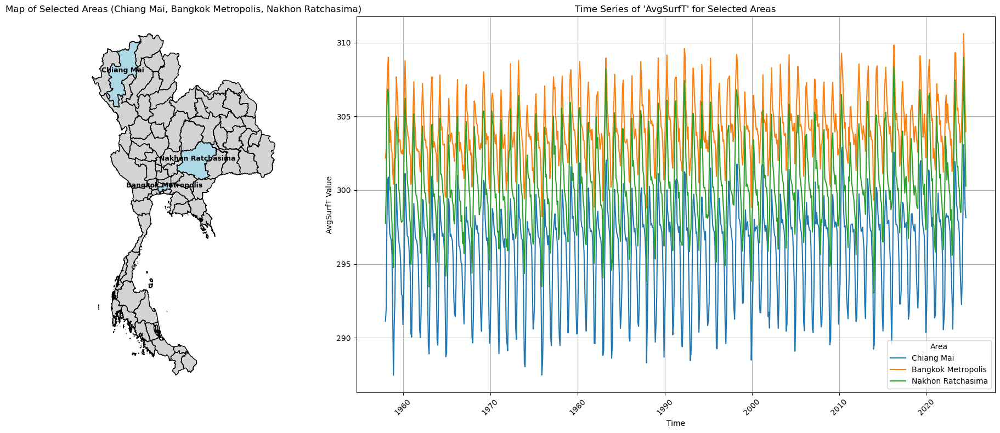

In [5]:
# Example call to the function
plot_map_variable_areas(
    data=dataset,  # Your xarray dataset
    variable='AvgSurfT',  # Example variable
    selected_areas=['Chiang Mai', 'Bangkok Metropolis', 'Nakhon Ratchasima'],  # List of selected areas
    gdf=gdf  # GeoDataFrame with geometries
)

#### Plot trend analysis 

In [6]:
def plot_trend_analysis(data, variable, area, model_type='additive', period=12):
    """
    Plot the original time series, trend, seasonality, and residuals for a given variable and area.
    It also highlights anomalies based on the residuals.
    
    Parameters:
    - data (xr.Dataset): The dataset containing multiple variables and areas.
    - variable (str): The name of the variable to analyze (e.g., 'AvgSurfT').
    - area (str): The name of the area for which to perform the analysis (e.g., 'Bangkok Metropolis').
    - model_type (str): Type of model for seasonal decomposition ('additive' or 'multiplicative').
    - period (int): The period for seasonal decomposition (e.g., 12 for monthly data).
    
    Returns:
    - None (plots the trend analysis)
    """
    # Convert the selected variable to a DataFrame
    variable_df = data[variable].to_pandas()

    # Check if the specified area exists in the DataFrame
    if area not in variable_df.columns:
        print(f"Error: Area '{area}' not found in the dataset.")
        return

    # Extract the time series data for the selected area
    time_series = variable_df[area].dropna()

    # Perform seasonal decomposition
    result = seasonal_decompose(time_series, model=model_type, period=period)

    # Plot the results
    plt.figure(figsize=(12, 10))
    
    # Plot the observed time series and yearly mean
    plt.subplot(411)
    plt.plot(result.observed, label='Observed', color='blue')
    plt.plot(time_series.resample('YE').mean(), 
             label=f'Yearly Mean for {area}', linestyle='--', color='red')
    plt.title(f"Observed Time Series and Yearly Mean - {variable} ({area})")
    plt.legend(loc='upper left')
    
    # Plot the trend component
    plt.subplot(412)
    plt.plot(result.trend, label='Trend', color='green')
    plt.title('Trend Component')
    plt.legend(loc='upper left')
    
    # Plot the seasonal component
    plt.subplot(413)
    plt.plot(result.seasonal, label='Seasonality', color='purple')
    plt.title('Seasonal Component')
    plt.legend(loc='upper left')
    
    # Plot the residuals and detect anomalies
    plt.subplot(414)
    threshold = 2 * result.resid.std()
    anomalies = result.resid[abs(result.resid) > threshold]
    plt.plot(result.resid, label='Residuals', color='grey')
    plt.scatter(anomalies.index, anomalies, color='orange', label='Anomalies')
    plt.axhline(y=threshold, color='red', linestyle='--', label='Upper Threshold')
    plt.axhline(y=-threshold, color='red', linestyle='--', label='Lower Threshold')
    plt.title('Residuals and Anomalies')
    plt.legend(loc='upper left')
    
    plt.tight_layout()
    plt.show()

    # Display anomaly statistics
    if not anomalies.empty:
        print(f"\nDetected {len(anomalies)} anomalies in the time series for {area}.")
    else:
        print(f"\nNo significant anomalies detected in the time series for {area}.")

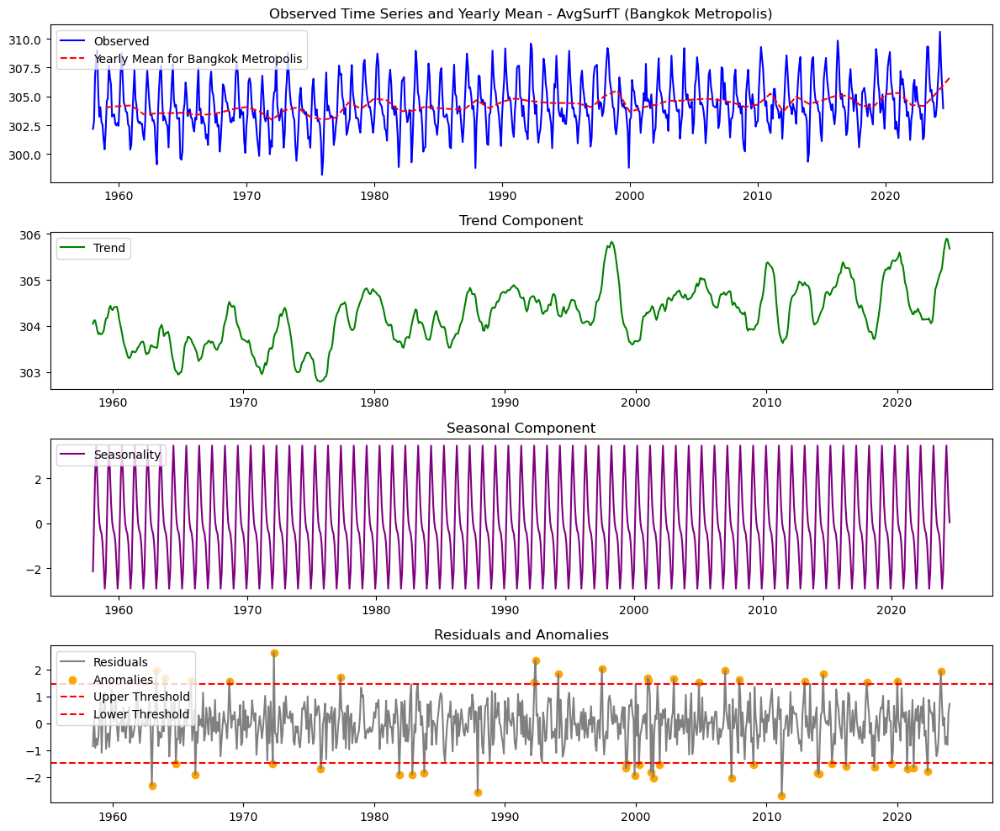


Detected 49 anomalies in the time series for Bangkok Metropolis.


In [7]:
# Example usage
plot_trend_analysis(data=dataset, variable='AvgSurfT', area='Bangkok Metropolis', model_type='additive', period=12)

#### Plot Mean Value and Visulized Map

In [8]:
def plot_map_mean(data, variable, shapefile_gdf, cmap='viridis', time_range=None, plot=True):
    """
    Plot a map of the mean values of a variable from the latest year in the dataset.

    Parameters:
    - data (xr.Dataset): The dataset containing variables and areas.
    - variable (str): The variable to plot (e.g., 'AvgSurfT').
    - shapefile_gdf (GeoDataFrame): GeoDataFrame containing the shapefile geometries with area names.
    - cmap (str): Colormap for visualization (default is 'viridis').

    Returns:
    - None (displays the plot)
    """
        # Subset the data for the specified time range
    if time_range:
        start_date, end_date = time_range
        data_var = data[variable].sel(time=slice(start_date, end_date))
    else:
        data_var = data[variable]
        
    # Convert the selected variable to a DataFrame
    data_var_df = data_var.to_pandas()

    # Calculate the mean for each area for the latest year
    mean_values = data_var_df.mean()

    # Create a mapping dictionary: area -> mean value
    area_mean_mapping = mean_values.to_dict()

    # Check the available areas in the shapefile
    shapefile_gdf = shapefile_gdf.copy()  # Avoid modifying the original GeoDataFrame
    shapefile_gdf['NAME_1'] = shapefile_gdf['NAME_1'].str.strip()

    # Merge the shapefile GeoDataFrame with the mean values
    shapefile_gdf['mean_value'] = shapefile_gdf['NAME_1'].map(area_mean_mapping)

    if plot:
        # Plotting the results
        fig, (ax_map, ax_ts) = plt.subplots(1, 2, figsize=(18, 8), gridspec_kw={'width_ratios': [1, 2]})
        # Plotting the map
        plt.figure(figsize=(15, 15))
        shapefile_gdf.plot(column='mean_value', 
                            cmap=cmap, 
                            linewidth=0.8, 
                            edgecolor='black', 
                            legend=True,
                            legend_kwds={'label': f'Mean {variable} for {time_range[0]} to {time_range[1]}', 'orientation': 'vertical'},
                            ax=ax_map)
        ax_map.set_title(f"Map of Mean {variable} ({time_range[0]} to {time_range[1]})")
        ax_map.axis('off')
            
        # Time series plot (SMI over time, averaged across areas)
        mean_over_time = data_var.mean(dim='area')
        mean_over_time.plot(ax=ax_ts, color='blue', label=f'Mean {variable}')
        ax_ts.set_title(f"{variable} Over Time ({time_range[0]} to {time_range[1]})")
        ax_ts.set_xlabel("Time")
        ax_ts.set_ylabel(f"{variable} Value")
        ax_ts.legend(loc='upper left')
        ax_ts.grid(True)
        
        plt.tight_layout()
        plt.show()

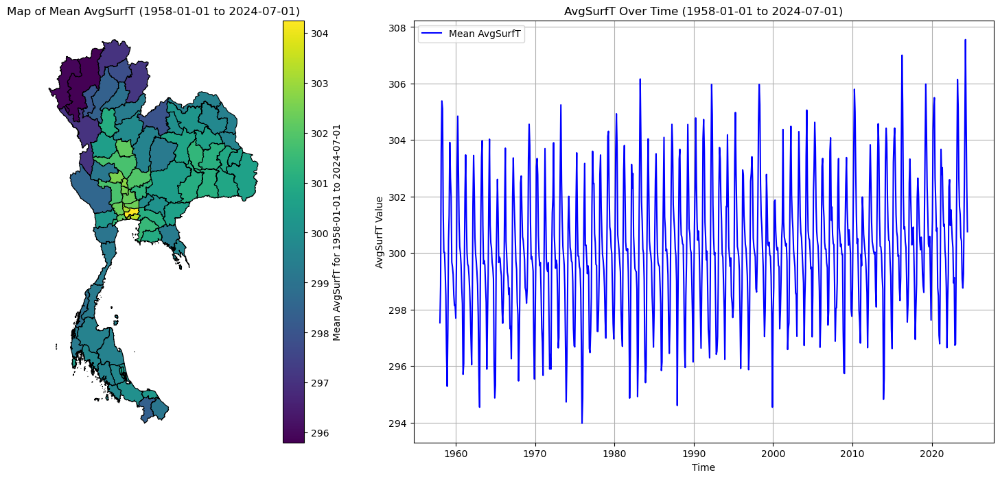

<Figure size 1500x1500 with 0 Axes>

In [9]:
# Example usage
plot_map_mean(data = dataset, variable = 'AvgSurfT', shapefile_gdf = gdf, cmap='viridis', 
              time_range=('1958-01-01', '2024-07-01'), plot=True)

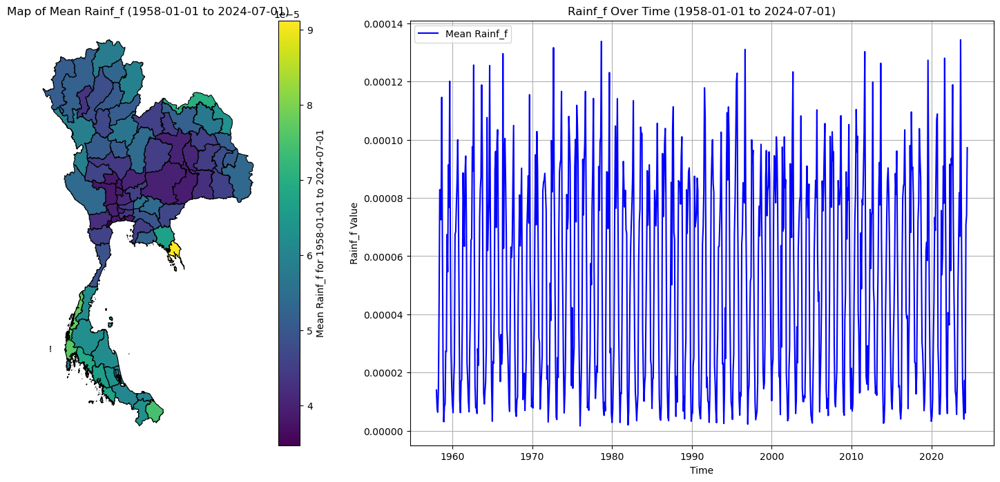

<Figure size 1500x1500 with 0 Axes>

In [10]:
plot_map_mean(data = dataset, variable = 'Rainf_f', shapefile_gdf = gdf, cmap='viridis', 
              time_range=('1958-01-01', '2024-07-01'), plot=True)

In [318]:
def plot_mean_map_all_variables(dataset, shapefile_gdf, cmap='viridis', time_range=None):
    """
    Plot mean maps for all variables in the dataset in a 4-column layout.

    Parameters:
    - dataset (xr.Dataset): The dataset containing variables and areas.
    - shapefile_gdf (GeoDataFrame): GeoDataFrame containing the shapefile geometries with area names.
    - cmap (str): Colormap for visualization (default is 'viridis').

    Returns:
    - None (displays the plots)
    """
    num_vars = len(dataset.data_vars)
    num_cols = 4
    num_rows = (num_vars + num_cols - 1) // num_cols  # Calculate the number of rows needed

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 5 * num_rows))
    axes = axes.flatten()  # Flatten the axes array for easy iteration

    for i, variable in enumerate(dataset.data_vars):
        # Subset the data for the specified time range
        if time_range:
            start_date, end_date = time_range
            data_var = dataset[variable].sel(time=slice(start_date, end_date))
        else:
            data_var = dataset[variable]

        # Convert the selected variable to a DataFrame
        data_var_df = data_var.to_pandas()

        # Calculate the mean for each area
        mean_values = data_var_df.mean()

        # Create a mapping dictionary: area -> mean value
        area_mean_mapping = mean_values.to_dict()

        # Check the available areas in the shapefile
        shapefile_gdf_copy = shapefile_gdf.copy()  # Avoid modifying the original GeoDataFrame
        shapefile_gdf_copy['NAME_1'] = shapefile_gdf_copy['NAME_1'].str.strip()

        # Merge the shapefile GeoDataFrame with the mean values
        shapefile_gdf_copy['mean_value'] = shapefile_gdf_copy['NAME_1'].map(area_mean_mapping)

        # Plotting the map
        ax = axes[i]
        shapefile_gdf_copy.plot(column='mean_value', 
                                cmap=cmap, 
                                linewidth=0.8, 
                                edgecolor='black', 
                                legend=True,
                                legend_kwds={'label': f'Mean {variable}', 'orientation': 'vertical'},
                                ax=ax)
        ax.set_title(f"Map of Mean {variable}")
        ax.axis('off')

    # Remove any unused subplots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

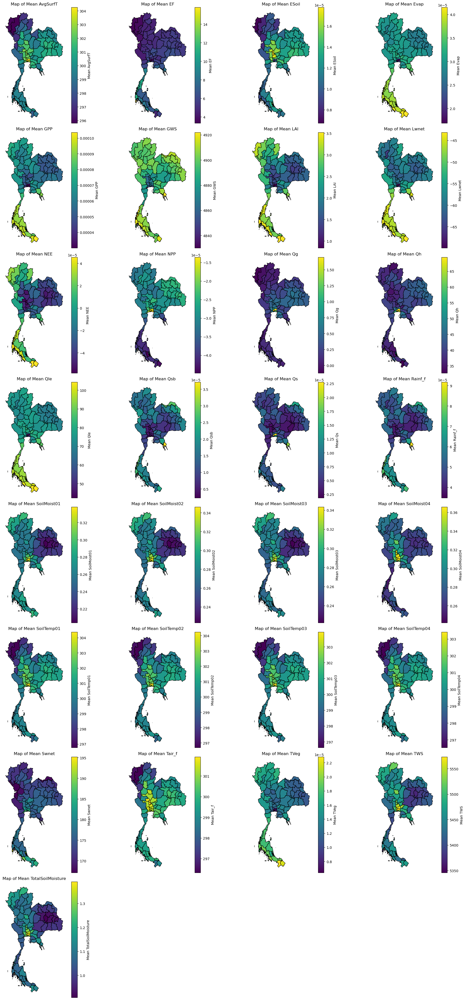

In [320]:
# Example usage:
plot_mean_map_all_variables(dataset, shapefile_gdf=gdf, cmap='viridis', time_range=('1960-01-01', '2024-07-01'))

In [332]:
import seaborn as sns

def identify_correlations(dataset):
    """
    Identify correlations between variables across areas in the dataset.

    Parameters:
    - dataset (xr.Dataset): The dataset containing variables and areas.

    Returns:
    - pd.DataFrame: Correlation matrix.
    """
    # Convert the dataset to a DataFrame
    df = dataset.to_dataframe().reset_index()

    # Exclude non-numeric columns
    df = df.select_dtypes(include=[float, int])

    # Calculate the correlation matrix
    correlation_matrix = df.corr()

    # Plot the correlation matrix
    plt.figure(figsize=(15, 10))
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
    plt.title('Correlation Matrix')
    plt.show()

    return correlation_matrix

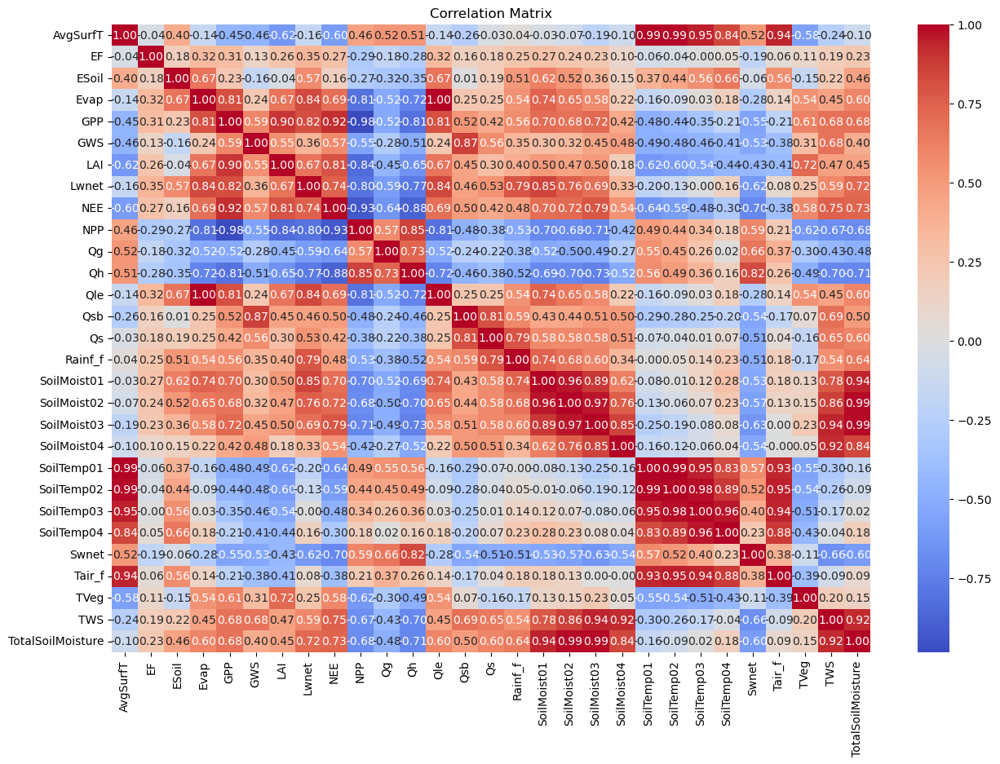

In [334]:
# Example usage:
correlation_matrix = identify_correlations(dataset)

#### Compute standardized index

In [48]:
def calculate_standardized_index(data, var, scale, shapefile_gdf=None, time_range=None, plot=True):
    """
    Calculate a standardized index for a variable using rolling statistics and optionally plot an overview.

    Parameters:
    - variable (xr.DataArray): Input data variable (e.g., Rainf_f, TWS).
    - scale (int): Rolling window size in time units (e.g., months).
    - shapefile_gdf (gpd.GeoDataFrame, optional): Shapefile for spatial mapping.
    - area_name (str, optional): Area for detailed time series (not used for overview plot).
    - time_range (tuple, optional): Time range for the analysis (start, end). Defaults to the full range.
    - plot (bool): If True, creates a spatial map and time-series plot.

    Returns:
    - xr.DataArray: Standardized index for the variable.
    """

    # Filter data by time range
    if time_range:
        variable = data[var].sel(time=slice(*time_range))
    else:
        variable = data[var]
        
    # Compute rolling mean
    rolling_mean = variable.rolling(time=scale, min_periods=1).mean()

    # Calculate mean and std for standardization
    long_term_mean = rolling_mean.mean(dim='time')
    long_term_std = rolling_mean.std(dim='time')

    # Standardize
    standardized_index = (rolling_mean - long_term_mean) / long_term_std

    # Plot results if requested
    if plot:
        if shapefile_gdf is None:
            raise ValueError("shapefile_gdf is required for plotting.")

        # Prepare data for spatial map
        mean_index = standardized_index.mean(dim="time")  # Mean over time for map
        #clipped_index = xr.where(mean_index > 3, 3, xr.where(mean_index < -3, -3, mean_index))  # Clip values for color scale
        area_mapping = dict(zip(variable['area'].values, mean_index.values))

        # Add mean standardized index to GeoDataFrame
        shapefile_gdf = shapefile_gdf.copy()
        shapefile_gdf['NAME_1'] = shapefile_gdf['NAME_1'].str.strip()  # Ensure consistent naming
        shapefile_gdf['std_index'] = shapefile_gdf['NAME_1'].map(area_mapping)

        # Create figure with two subplots
        fig, (ax_map, ax_ts) = plt.subplots(1, 2, figsize=(18, 8), gridspec_kw={'width_ratios': [1, 2]})

        # Map Plot: Spatial distribution of mean standardized index
        shapefile_gdf.plot(
            column='std_index', 
            cmap='RdBu', 
            linewidth=0.8, 
            edgecolor='black', 
            legend=True, #vmin=-3, vmax=3,  # Adjust limits based on scale
            legend_kwds={'label': 'Standardized Index', 'orientation': 'vertical'},
            ax=ax_map
        )
        ax_map.set_title(f"Spatial Distribution of {var} Mean Index")
        ax_map.axis('off')

        # Time Series Plot: Average standardized index over time
        avg_time_series = standardized_index.mean(dim="area")  # Mean over all areas
        avg_time_series.plot(ax=ax_ts, color='blue', label='Average Standardized Index')
        ax_ts.axhline(0, color='black', linestyle='--', linewidth=1)
        ax_ts.set_title(f"Temporal Trend of {var} Average Standardized Index ({time_range[0]} to {time_range[1]})")
        ax_ts.set_xlabel("Time")
        ax_ts.set_ylabel("Standardized Index Value")
        ax_ts.legend(loc='upper left')
        ax_ts.grid(True)

        plt.tight_layout()
        plt.show()

    return standardized_index

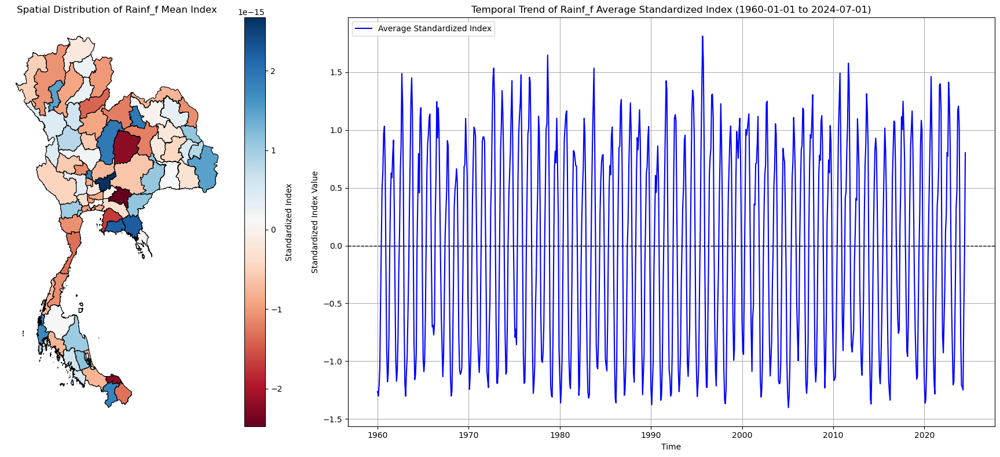

In [50]:
rainf_index = calculate_standardized_index(data = dataset, 
                                              var="Rainf_f", 
                                              scale = 3, 
                                              shapefile_gdf=gdf, 
                                              time_range=['1960-01-01', '2024-07-01'], plot=True)

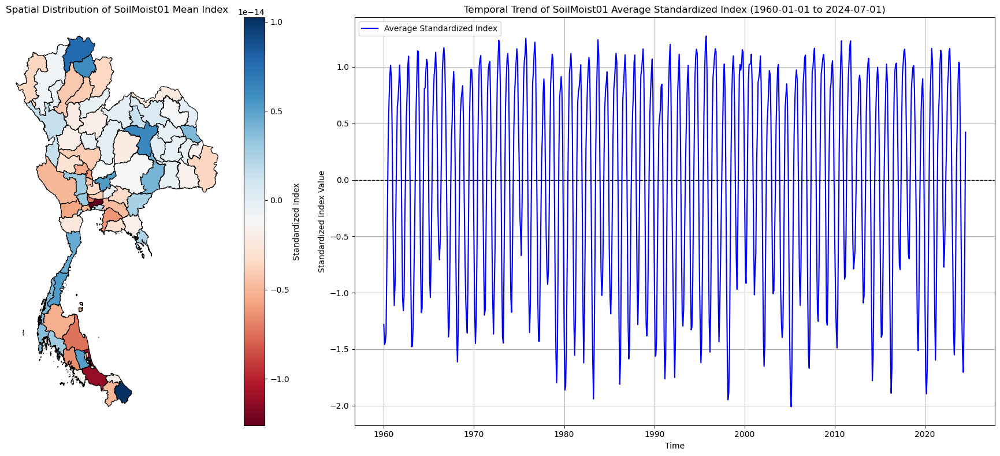

In [52]:
sm_index = calculate_standardized_index(data = dataset, 
                                              var="SoilMoist01", 
                                              scale = 3, 
                                              shapefile_gdf=gdf, 
                                              time_range=['1960-01-01', '2024-07-01'], plot=True)

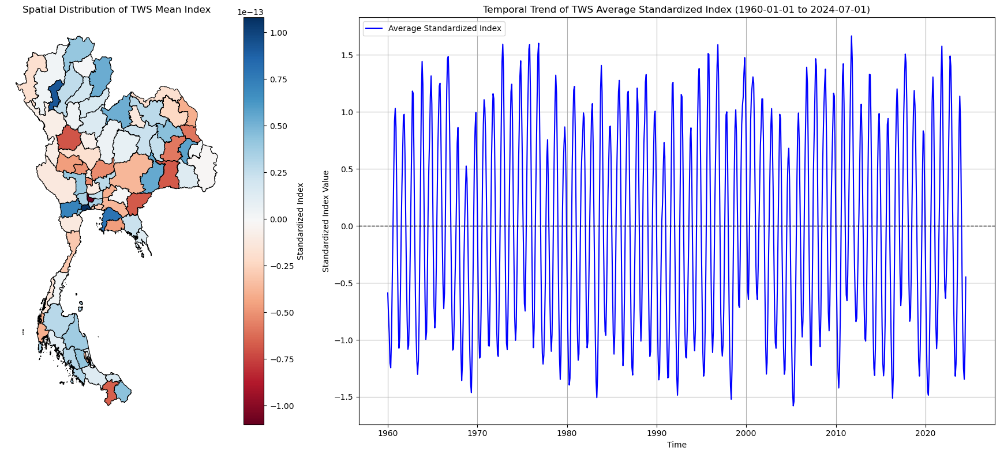

In [54]:
tws_index = calculate_standardized_index(data = dataset, 
                                              var="TWS", 
                                              scale = 3, 
                                              shapefile_gdf=gdf, 
                                              time_range=['1960-01-01', '2024-07-01'], plot=True)

#### Compute SPI and SPEI index and visualization

In [11]:
def compute_index(data, index_type='SPI', accumulation_periods=None):
    """
    Calculate Standardized Precipitation Index (SPI) or 
    Standardized Precipitation-Evapotranspiration Index (SPEI)
    
    Parameters:
    -----------
    data : xarray.DataArray
        Input data (precipitation or water balance).
    index_type : str
        'SPI' or 'SPEI'.
    accumulation_periods : list, optional
        List of accumulation periods (default: [3, 6, 12]).
    
    Returns:
    --------
    xarray.Dataset with standardized index.
    """
    if accumulation_periods is None:
        accumulation_periods = [3, 6, 12]

    # Store results for different accumulation periods
    results = {}
    
    for period in accumulation_periods:
        # Compute rolling sum
        aggregated_data = data.rolling(time=period, min_periods=1).sum(skipna=True)
        
        # Compute standardized index for each area
        standardized_index = []
        
        for area_idx in range(aggregated_data.shape[1]):
            area_series = aggregated_data[:, area_idx].values
            
            # Remove zeros and negative values for gamma distribution
            #valid_data = area_series[area_series > 0]
            valid_data = area_series[~np.isnan(area_series) & (area_series > 0)]
            if len(valid_data) <= 1:  # Not enough valid data to fit gamma
                print(f"Insufficient valid data for area {area_idx}")
                area_std_index = [np.nan] * len(area_series)
                standardized_index.append(area_std_index)
                continue
            # Estimate gamma distribution parameters
            alpha, _, beta = stats.gamma.fit(valid_data, floc=0)
            
            # Compute standardized index
            area_std_index = []
            for value in area_series:
                if np.isnan(value) or value <= 0:
                    area_std_index.append(np.nan)
                else:
                    # Compute cumulative probability
                    cdf = stats.gamma.cdf(value, a=alpha, scale=beta)
                    # Convert to standard normal distribution
                    area_std_index.append(stats.norm.ppf(cdf))
            
            standardized_index.append(area_std_index)
        
        # Create DataArray with results and assign a name
        results[f'{index_type}_{period}month'] = xr.DataArray(
            np.column_stack(standardized_index),
            dims=['time', 'area'],
            coords={
                'time': data.time,
                'area': data.area
            },
            name=f'{index_type}_{period}month'  # Assign name
        )
    
    return xr.merge(results.values())  # Merge all named DataArrays

In [12]:
def compute_spi_spei(dataset):
    """
    Compute SPI and SPEI for the given dataset
    
    Parameters:
    -----------
    dataset : xarray.Dataset
        Input dataset
    
    Returns:
    --------
    xarray.Dataset with SPI and SPEI
    """
    # Compute SPI (using Evaporation as a proxy for precipitation)
    spi = compute_index(dataset['Rainf_f'], index_type='SPI')
    
    # Compute SPEI (the difference between precipitation and reference evapotranspiration (P – ETo))
    computed_spei = dataset['Rainf_f'] - dataset['Evap'] 
    #computed_spei = computed_spei.where(computed_spei > 0)
    min_val = computed_spei.min().item()
    computed_spei_shifted = computed_spei - min_val + 1e-6 
    computed_spei_shifted.name = 'spei'  # Ensure named before passing
    spei = compute_index(computed_spei_shifted, index_type='SPEI')
    
    return xr.merge([spi, spei])  # Merge SPI and SPEI results

In [104]:
def plot_spi_spei(data, shapefile_gdf, time_range=None, plot=True):

    # Subset the data for the specified time range
    if time_range:
        start_date, end_date = time_range
        dt = data.sel(time=slice(start_date, end_date))
    else:
        dt = data
    
    if plot:
        std = dt.std(dim='time')
        mean = dt.mean(dim='time')
        data_rescaled = (dt - mean) / std
        clipped_data = xr.where(data_rescaled > 3, 3, xr.where(data_rescaled < -3, -3, data_rescaled))
        
        area = dt['area'].values
        clipped_data_flat = clipped_data.values.flatten()
        
        area_mean_mapping = dict(zip(area, clipped_data_flat))
        
        # Prepare GeoDataFrame for plotting
        shapefile_gdf = shapefile_gdf.copy()  # Avoid modifying the original GeoDataFrame
        shapefile_gdf['NAME_1'] = shapefile_gdf['NAME_1'].str.strip()
        shapefile_gdf['mean_spi'] = shapefile_gdf['NAME_1'].map(area_mean_mapping)
        
        # Plotting the results
        fig, (ax_map, ax_ts) = plt.subplots(1, 2, figsize=(18, 8), gridspec_kw={'width_ratios': [1, 2]})
        
        # Map plot (Mean SMI per area)
        shapefile_gdf.plot(
            column='mean_spi', 
            cmap='RdBu', 
            linewidth=0.8, 
            edgecolor='black', 
            legend=True, #vmin=-3, vmax=3, 
            legend_kwds={'label': 'Standardized Precipitation-Evapotranspiration Index (SPEI)', 'orientation': 'vertical'},
            ax=ax_map
        )
        ax_map.set_title(f"Map of Mean SPEI ({time_range[0]} to {time_range[1]})")
        ax_map.axis('off')
        
        # Time series plot (SMI over time, averaged across areas)
        data_mean_over_time = dt.mean(dim='area')
        data_mean_over_time.plot(ax=ax_ts, color='blue', label='Mean SPEI')
        ax_ts.set_title(f"SPEI Over Time ({time_range[0]} to {time_range[1]})")
        ax_ts.set_xlabel("Time")
        ax_ts.set_ylabel("SPEI Value")
        ax_ts.legend(loc='upper left')
        ax_ts.grid(True)
        
        plt.tight_layout()
        plt.show()

In [14]:
spi_spei_results = compute_spi_spei(dataset)

In [15]:
spi_spei_results

<xarray.Dataset> Size: 3MB
Dimensions:       (time: 799, area: 78)
Coordinates:
  * time          (time) datetime64[ns] 6kB 1958-01-01 1958-02-01 ... 2024-07-01
  * area          (area) <U27 8kB 'Chai Nat' 'Chaiyaphum' ... 'Yala' 'Yasothon'
Data variables:
    SPI_3month    (time, area) float64 499kB -1.663 -1.863 ... -0.008461 1.048
    SPI_6month    (time, area) float64 499kB -3.619 -3.914 ... -1.29 0.2414
    SPI_12month   (time, area) float64 499kB -10.18 -12.05 ... 0.6886 0.1621
    SPEI_3month   (time, area) float64 499kB -3.302 -2.886 ... -0.1008 1.269
    SPEI_6month   (time, area) float64 499kB -7.147 -5.738 ... -1.446 0.4698
    SPEI_12month  (time, area) float64 499kB -13.43 -13.65 ... 0.6944 0.4739

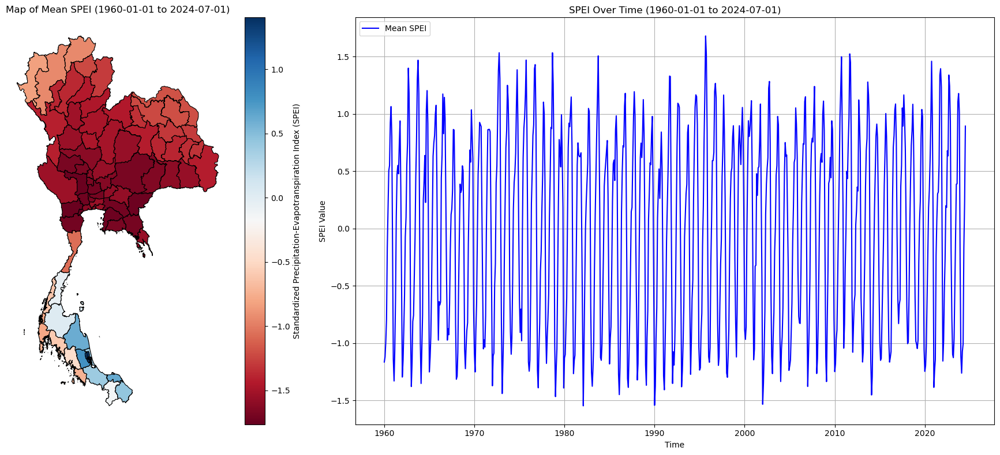

In [16]:
plot_spi_spei(spi_spei_results['SPEI_3month'], gdf, time_range=['1960-01-01', '2024-07-01'], plot=True)

In [17]:
import numpy as np
import matplotlib.pyplot as plt

def plot_spi_spei_area(data, shapefile_gdf, area_names="Bangkok Metropolis", time_range=None):
    """
    Plot SPI and SPEI for selected areas on a map and as time series.

    Parameters:
    -----------
    data : xarray.Dataset
        SPI and SPEI dataset with 'time' and 'area' dimensions.
    shapefile_gdf : geopandas.GeoDataFrame
        Shapefile GeoDataFrame containing area geometries and names.
    area_names : str or list
        Name(s) of the area(s) to plot. Defaults to "Bangkok Metropolis".
    time_range : tuple, optional
        Time range to filter data (start, end). Defaults to full range.
    """
    # Ensure area_names is a list for consistency
    if isinstance(area_names, str):
        area_names = [area_names]

    # Filter data to the specified time range
    if time_range:
        spi_spei = data.sel(time=slice(*time_range))
    else:
        spi_spei = data

    # Check if selected areas are present in the GeoDataFrame
    missing_areas = [area for area in area_names if area not in shapefile_gdf['NAME_1'].values]
    if missing_areas:
        print(f"Warning: The following areas are not found in the shapefile: {missing_areas}")
        area_names = [area for area in area_names if area not in missing_areas]  # Remove missing areas

    # Set up the figure and axes for a side-by-side layout
    fig, (ax_map, ax_ts) = plt.subplots(1, 2, figsize=(18, 8), gridspec_kw={'width_ratios': [1, 2]})

    # Plot the map on the left
    shapefile_gdf.plot(ax=ax_map, color='lightgrey', edgecolor='black')  # Plot all areas in grey

    # Highlight selected areas in light blue
    shapefile_gdf[shapefile_gdf['NAME_1'].isin(area_names)].plot(ax=ax_map, color='lightblue', edgecolor='black')

    # Annotate each selected area
    for area_name in area_names:
        # Safely get the centroid for annotation
        area_geometry = shapefile_gdf[shapefile_gdf['NAME_1'] == area_name].geometry.iloc[0]
        centroid = area_geometry.centroid
        ax_map.annotate(area_name, xy=(centroid.x, centroid.y),
                        ha='center', fontsize=9, color='black', weight='bold')

    # Customize the map
    ax_map.set_title(f"Map of Selected Areas ({', '.join(area_names)})")
    ax_map.axis('off')  # Turn off axis for a cleaner map appearance

    # Plot time series for each selected area on the right
    for area_name in area_names:
        # Find the index of the specified area
        try:
            area_idx = np.where(spi_spei['area'].values == area_name)[0].item()
        except ValueError:
            print(f"Area '{area_name}' not found in the dataset.")
            continue
        
        spi = spi_spei['SPI_3month'][:, area_idx]
        spei = spi_spei['SPEI_3month'][:, area_idx]

        # Plot SPI and SPEI on the same axis
        ax_ts.plot(spi_spei.time, spi, label=f'{area_name} SPI (3-month)', linestyle='-', linewidth=2)
        ax_ts.plot(spi_spei.time, spei, label=f'{area_name} SPEI (3-month)', linestyle='--', linewidth=2)

    # Add time series customizations
    ax_ts.axhline(0, color='black', linestyle=':', linewidth=1)
    ax_ts.set_title(f"SPI and SPEI (3-month) Temporal Trends")
    ax_ts.legend(title="Legend", fontsize=9)
    ax_ts.set_xlabel("Time")
    ax_ts.set_ylabel("Index Value")
    ax_ts.grid(True)

    # Final adjustments and show the plot
    plt.tight_layout()
    plt.show()

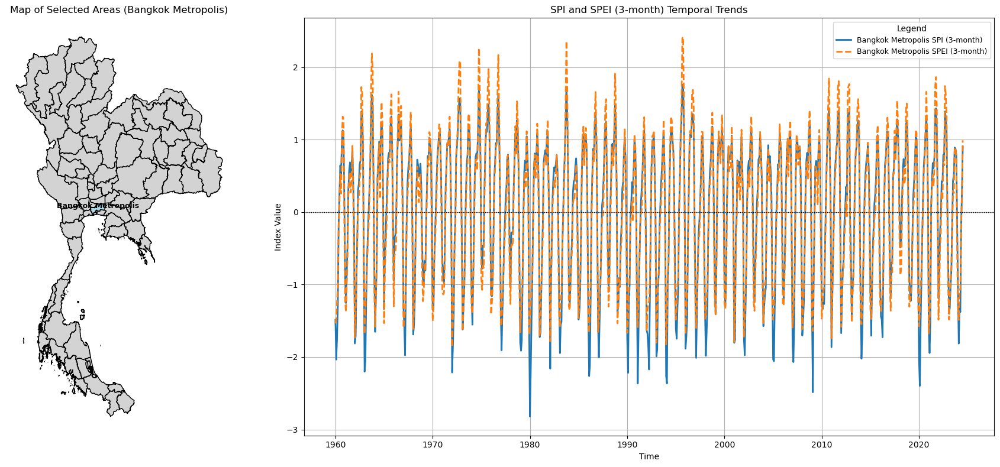

In [18]:
plot_spi_spei_area(spi_spei_results, gdf, area_names="Bangkok Metropolis", time_range=['1960-01-01', '2024-07-01'])

#### Compute CWSI

In [137]:
def calculate_cwsi_with_flux(dataset, shapefile_gdf, time_range, plot=True):
    """
    Compute the Crop Water Stress Index (CWSI) using the refined formula with heat fluxes:
    CWSI = (Tc - Ta - (Qh / Qle)) / ((Tcu - Ta) - (Tcl - Ta))

    Parameters:
    - dataset (xarray.Dataset): The dataset containing air temperature (Tair_f_tavg),
      latent heat flux (Qle_tavg), and sensible heat flux (Qh_tavg).
    - Tcl (float): The canopy temperature of a non-stressed crop (°C), default is 296.5°C.
    - Tcu (float): The canopy temperature of a severely stressed crop (°C), default is 308°C.
    - rho (float): Air density (kg/m³), default is 1.225 kg/m³.
    - cp (float): Specific heat of air at constant pressure (J/(kg·K)), default is 1005 J/(kg·K).

    Returns:
    - xarray.Dataset: The dataset with an additional variable "CWSI".
    """
    Tcl=296.5
    Tcu=308.0
    rho=1.225
    cp=1005

    if time_range:
        data_time = dataset.sel(time=slice(*time_range))
    else:
        data_time = dataset
        
    # Get air temperature (Ta)
    Ta = data_time["Tair_f"]  # Air temperature (°C)

    # Estimate canopy temperature (Tc) using sensible heat flux (Qh)
    Qh = data_time["Qh"]  # Sensible heat flux (W/m²)
    Tc = Ta + Qh / (rho * cp)  # Estimate canopy temperature (°C)

    # Get latent heat flux (Qle)
    Qle = data_time["Qle"]  # Latent heat flux

    # Calculate the adjusted CWSI
    cwsi = (Tc - Ta - (Qh / Qle)) / ((Tcu - Ta) - (Tcl - Ta))
    
    if plot:
        std = cwsi.std(dim='time')
        mean = cwsi.mean(dim='time')
        data_rescaled = (cwsi - mean) / std
        #clipped_data = xr.where(data_rescaled > 3, 3, xr.where(data_rescaled < -3, -3, data_rescaled))
        
        area = cwsi['area'].values
        clipped_data_flat = data_rescaled.values.flatten()
        
        area_mean_mapping = dict(zip(area, clipped_data_flat))
        
        # Prepare GeoDataFrame for plotting
        shapefile_gdf = shapefile_gdf.copy()  # Avoid modifying the original GeoDataFrame
        shapefile_gdf['NAME_1'] = shapefile_gdf['NAME_1'].str.strip()
        shapefile_gdf['cwsi'] = shapefile_gdf['NAME_1'].map(area_mean_mapping)
        
        # Plotting the results
        fig, (ax_map, ax_ts) = plt.subplots(1, 2, figsize=(18, 8), gridspec_kw={'width_ratios': [1, 2]})
        
        # Map plot (Mean SMI per area)
        shapefile_gdf.plot(
            column='cwsi', 
            cmap='RdBu', 
            linewidth=0.8, 
            edgecolor='black', 
            legend=True, #vmin=-3, vmax=3, 
            legend_kwds={'label': 'Crop Water Stress Index (CSWI)', 'orientation': 'vertical'},
            ax=ax_map
        )
        ax_map.set_title(f"Map of Crop Water Stress Index ({time_range[0]} to {time_range[1]})")
        ax_map.axis('off')
        
        # Time series plot (SMI over time, averaged across areas)
        data_mean_over_time = cwsi.mean(dim='area')
        data_mean_over_time.plot(ax=ax_ts, color='blue', label='Mean CSWI')
        ax_ts.set_title(f"Mean CSWI Over Time ({time_range[0]} to {time_range[1]})")
        ax_ts.set_xlabel("Time")
        ax_ts.set_ylabel("CSWI Value")
        ax_ts.legend(loc='upper left')
        ax_ts.grid(True)
        
        plt.tight_layout()
        plt.show()

    return cwsi

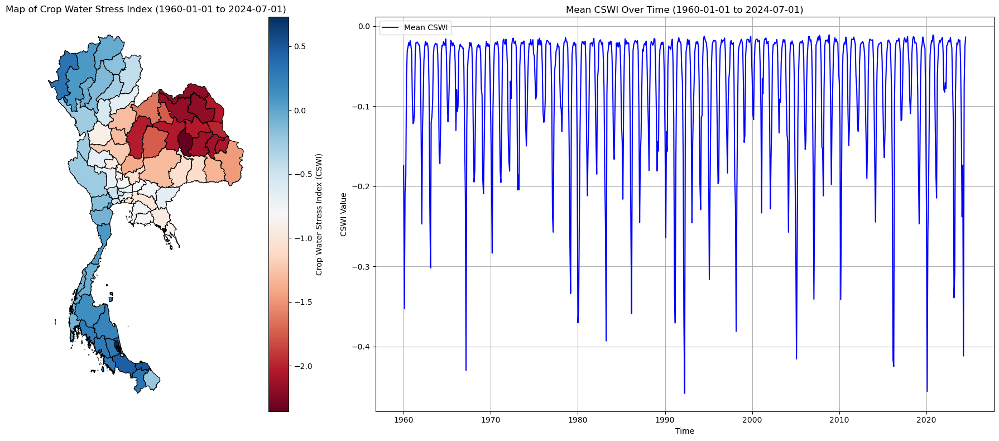

In [139]:
cwsi_index = calculate_cwsi_with_flux(dataset, shapefile_gdf=gdf, time_range=['1960-01-01', '2024-07-01'], plot=True)

#### Compute Evapotranspiration (ET) and Water Use Efficiency (WUE)

In [153]:
def calculate_et_wue(dataset, lambda_v=2.45e6, shapefile_gdf=gdf, time_range=None, plot=True):
    """
    Compute Evapotranspiration (ET) and Water Use Efficiency (WUE).

    Parameters:
    - dataset (xarray.Dataset): The dataset containing latent heat flux (Qle_tavg) and GPP.
    - lambda_v (float): Latent heat of vaporization (J/kg), default is 2.45e6 J/kg.

    Returns:
    - xarray.Dataset: The dataset with added variables "ET" and "WUE".
    """
    if time_range:
        data_time = dataset.sel(time=slice(*time_range))
    else:
        data_time = dataset
        
    # Calculate Evapotranspiration (ET)
    Qle = data_time["Qle"]  # Latent heat flux (W/m²)
    ET = data_time["Evap"] * 86400  # Convert from kg/m²/s to mm/day

    # Calculate Water Use Efficiency (WUE)
    GPP = data_time["GPP"]  # Gross Primary Production (gC/m²/day)
    WUE = GPP / ET

    if plot:
        area = WUE['area'].values
        WUE_flat = WUE.values.flatten()
        
        area_mean_mapping = dict(zip(area, WUE_flat))
        
        # Prepare GeoDataFrame for plotting
        shapefile_gdf = shapefile_gdf.copy()  # Avoid modifying the original GeoDataFrame
        shapefile_gdf['NAME_1'] = shapefile_gdf['NAME_1'].str.strip()
        shapefile_gdf['WUE'] = shapefile_gdf['NAME_1'].map(area_mean_mapping)
        
        # Plotting the results
        fig, (ax_map, ax_ts) = plt.subplots(1, 2, figsize=(18, 8), gridspec_kw={'width_ratios': [1, 2]})
        
        # Map plot
        shapefile_gdf.plot(
            column='WUE', 
            cmap='RdBu', 
            linewidth=0.8, 
            edgecolor='black', 
            legend=True, #vmin=-3, vmax=3, 
            legend_kwds={'label': 'Evapotranspiration (ET) and Water Use Efficiency (WUE)', 'orientation': 'vertical'},
            ax=ax_map
        )
        ax_map.set_title(f"Map of ET and WUE Index")
        ax_map.axis('off')
        
        # Time series plot (SMI over time, averaged across areas)
        data_mean_over_time = WUE.mean(dim='area')
        data_mean_over_time.plot(ax=ax_ts, color='blue', label='Mean WUE')
        ax_ts.set_title(f"Mean Evapotranspiration (ET) and Water Use Efficiency (WUE) Over Time ({time_range[0]} to {time_range[1]})")
        ax_ts.set_xlabel("Time")
        ax_ts.set_ylabel("WUE Value")
        ax_ts.legend(loc='upper left')
        ax_ts.grid(True)
        
        plt.tight_layout()
        plt.show()

    
    return WUE

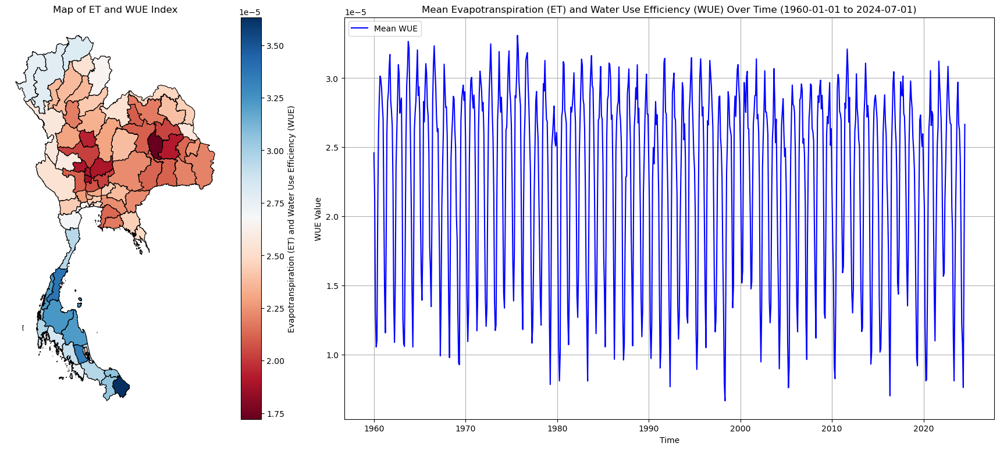

In [155]:
# Example usage
wue = calculate_et_wue(dataset, lambda_v=2.45e6, shapefile_gdf=gdf, time_range=['1960-01-01', '2024-07-01'], plot=True)

### Compute the Agricultural Productivity Index (API)

In [175]:
def calculate_api(dataset, weights=None, shapefile_gdf=gdf, time_range=None, plot=True):
    """
    Compute the Agricultural Productivity Index (API).

    Parameters:
    - dataset (xarray.Dataset): The dataset containing GPP, WUE, LAI, Soil Moisture, and ET.
    - weights (list): List of weights for [GPP, WUE, LAI, Soil Moisture, ET]. Default is equal weighting.

    Returns:
    - xarray.DataArray: The Agricultural Productivity Index (API).
    """
    # Default weights if not provided
    if weights is None:
        weights = [0.3, 0.2, 0.2, 0.2, 0.1]
    if len(weights) != 5:
        raise ValueError("Weights list must contain exactly 5 values for GPP, WUE, LAI, Soil Moisture, and ET.")
        
    # Subset data to the time range if provided
    if time_range:
        dataset = dataset.sel(time=slice(*time_range))
        
    # Extract relevant variables
    try:
        GPP = dataset["GPP"]
        WUE = calculate_et_wue(dataset, time_range, plot=False)
        LAI = dataset["LAI"]
        SoilMoist = (dataset["SoilMoist01"] + dataset["SoilMoist02"] +
                     dataset["SoilMoist03"] + dataset["SoilMoist04"]) / 4
        ET = dataset["Evap"]
    except KeyError as e:
        raise KeyError(f"Missing variable in the dataset: {e}")
    
    # Normalize each variable (dimension-wise normalization)
    def normalize(var, dim="time"):
        return (var - var.min(dim=dim)) / (var.max(dim=dim) - var.min(dim=dim))
    
    GPP_n = normalize(GPP)
    WUE_n = normalize(WUE)
    LAI_n = normalize(LAI)
    SoilMoist_n = normalize(SoilMoist)
    ET_n = normalize(ET)
    
    # Compute API
    API = (weights[0] * GPP_n +
           weights[1] * WUE_n +
           weights[2] * LAI_n +
           weights[3] * SoilMoist_n +
           weights[4] * ET_n)
    
    # Assign attributes and return
    API.attrs = {
        "units": "dimensionless",
        "long_name": "Agricultural Productivity Index",
        "description": "Weighted index combining GPP, WUE, LAI, Soil Moisture, and ET"
    }
    # Plot results if requested
    if plot:
        if shapefile_gdf is None:
            raise ValueError("shapefile_gdf is required for plotting.")
        
        # Prepare data for the map
        mean_api = API.mean(dim="time")  # Mean API over time
        area_mapping = dict(zip(dataset['area'].values, mean_api.values))
        shapefile_gdf = shapefile_gdf.copy()
        shapefile_gdf['API'] = shapefile_gdf['NAME_1'].map(area_mapping)
        
        # Plot results
        fig, (ax_map, ax_ts) = plt.subplots(1, 2, figsize=(18, 8), gridspec_kw={'width_ratios': [1, 2]})
        
        # Map plot
        shapefile_gdf.plot(
            column='API',
            cmap='RdBu',
            linewidth=0.8,
            edgecolor='black',
            legend=True,
            vmin=0,
            vmax=1,
            legend_kwds={'label': 'Agricultural Productivity Index (API)', 'orientation': 'vertical'},
            ax=ax_map
        )
        ax_map.set_title("Spatial Distribution of API")
        ax_map.axis('off')
        
        # Time series plot
        mean_api_time = API.mean(dim="area")
        mean_api_time.plot(ax=ax_ts, color='blue', label='Mean API')
        ax_ts.axhline(0, color='black', linestyle='--', linewidth=1)
        ax_ts.set_title("Temporal Trend of API")
        ax_ts.set_xlabel("Time")
        ax_ts.set_ylabel("API Value")
        ax_ts.legend(loc='upper left')
        ax_ts.grid(True)
        
        plt.tight_layout()
        plt.show()
            
    return API

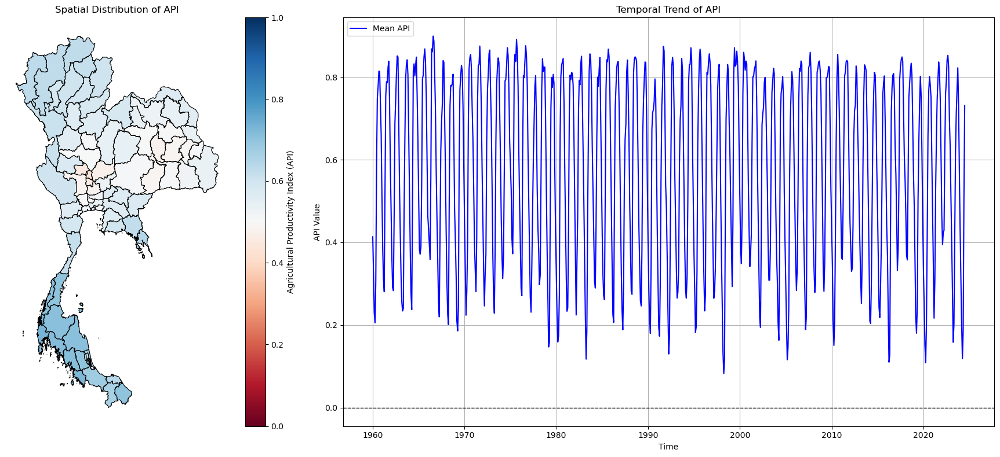

In [181]:
# Example usage
api = calculate_api(dataset, weights=[0.3, 0.2, 0.2, 0.2, 0.1],
                    shapefile_gdf=gdf, time_range=['1960-01-01', '2024-07-01'], plot=True)

#### ESSMI Computation:
Data Preparation:

Use soil moisture data (e.g., from satellite observations or field data) aggregated over specific time periods (e.g., 1-, 3-, 6-, or 12-months).
Fitting an Empirical PDF (ePDF):

Fit a non-parametric kernel density estimator (KDE) to the historical soil moisture time series. This avoids assumptions about the data distribution, making it more robust to skewed or bimodal distributions.
Use a boundary correction technique since soil moisture data is bounded (e.g., between 0 and 1).
Cumulative Distribution Function (CDF):

Compute the non-exceedance probability for the observed soil moisture values relative to the fitted ePDF.
Transform to Standard Normal Distribution:

Convert the non-exceedance probability into a z-score using the inverse of the standard normal distribution. This standardization ensures the values have a mean of 0 and a standard deviation of 1.
Classification of Drought Intensities:

Assign categories based on the thresholds for ESSMI values:
ESSMI ≥ 2.0: Extreme wet
1.5 ≤ ESSMI < 2.0: Severe wet
1.0 ≤ ESSMI < 1.5: Moderate wet
-1.0 < ESSMI < 1.0: Near normal
-1.5 < ESSMI ≤ -1.0: Moderate dry
-2.0 < ESSMI ≤ -1.5: Severe dry
ESSMI ≤ -2.0: Extreme dry

In [211]:
def compute_essmi(dataset, var, bandwidth=0.05, shapefile_gdf=gdf, time_range=None, plot=True):
    """
    Compute the Empirical Standardized Soil Moisture Index (ESSMI).

    Parameters:
    -----------
    soil_moisture_data : xarray.DataArray
        Historical soil moisture time series (e.g., 1-month, 3-month averages).
    bandwidth : float, optional
        Bandwidth for the Kernel Density Estimator (default is 0.05).

    Returns:
    --------
    xarray.DataArray
        ESSMI values with the same dimensions as `soil_moisture_data`.
    """
    # Filter ESSMI data to the time range
    if time_range:
        data = dataset[var].sel(time=slice(*time_range))
    else:
        data = dataset[var]
        
    # Flatten data and remove NaNs for KDE fitting
    historical_values = data.values.flatten()
    historical_values = historical_values[~np.isnan(historical_values)]

    # Fit Kernel Density Estimator (KDE) to historical data
    kde = KernelDensity(kernel="gaussian", bandwidth=bandwidth)
    kde.fit(historical_values[:, None])

    # Boundary correction for bounded data (0, 1)
    def boundary_corrected_pdf(values):
        log_density = kde.score_samples(values[:, None])
        pdf = np.exp(log_density)
        return pdf

    # Compute cumulative probability for each value
    cumulative_probs = []
    for value in data.values.flatten():
        if np.isnan(value):
            cumulative_probs.append(np.nan)
        else:
            # Calculate non-exceedance probability
            cdf = (historical_values <= value).sum() / len(historical_values)
            cumulative_probs.append(cdf)

    # Transform CDF to standard normal (z-score)
    cumulative_probs = np.array(cumulative_probs).reshape(data.shape)
    z_scores = norm.ppf(cumulative_probs)

    # Convert back to xarray.DataArray with the same coordinates
    essmi = xr.DataArray(
        z_scores,
        dims=data.dims,
        coords=data.coords,
        name="ESSMI"
    )
    if plot:
        # Calculate mean ESSMI over time for each area
        essmi_mean = essmi.mean(dim='time')
        
        # Create a mapping of area names to mean ESSMI values
        area_mean_mapping = dict(zip(essmi['area'].values, essmi_mean.values))
        
        # Prepare GeoDataFrame for plotting
        shapefile_gdf = shapefile_gdf.copy()  # Avoid modifying the original GeoDataFrame
        shapefile_gdf['NAME_1'] = shapefile_gdf['NAME_1'].str.strip()  # Ensure consistent naming
        shapefile_gdf['mean_essmi'] = shapefile_gdf['NAME_1'].map(area_mean_mapping)
        
        # Plotting the results
        fig, (ax_map, ax_ts) = plt.subplots(1, 2, figsize=(18, 8), gridspec_kw={'width_ratios': [1, 2]})
        
        # Map plot (Mean ESSMI per area)
        shapefile_gdf.plot(
            column='mean_essmi', 
            cmap='RdBu', 
            linewidth=0.8, 
            edgecolor='black', 
            legend=True, vmin=-3, vmax=3,  # Adjust limits based on ESSMI scale
            legend_kwds={'label': 'Mean ESSMI', 'orientation': 'vertical'},
            ax=ax_map
        )
        ax_map.set_title(f"Map of Mean ESSMI ({time_range[0]} to {time_range[1]})")
        ax_map.axis('off')
        
        # Time Series plot
        essmi_mean_time = essmi.mean(dim='area')
        essmi_mean_time.plot(ax=ax_ts, color='blue', label='Mean ESSMI (all areas)')
        ax_ts.axhline(0, color='black', linestyle='--', linewidth=1)
        ax_ts.set_title("Empirical Standardized Soil Moisture Index (ESSMI) Time Series (All Areas)")
        ax_ts.set_ylabel("ESSMI")
        ax_ts.set_xlabel("Time")
        ax_ts.legend()
        ax_ts.grid(True)
        
        plt.tight_layout()
        plt.show()
        
    return essmi

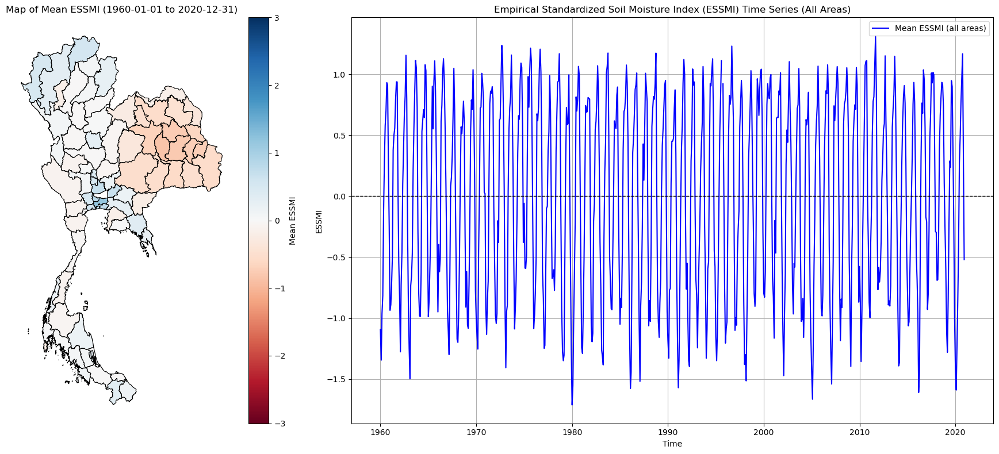

In [213]:
essmi = compute_essmi(dataset, var='SoilMoist01', bandwidth=0.05, shapefile_gdf=gdf, time_range=['1960-01-01', '2020-12-31'], plot=True)

In [195]:
soil_moisture_vars = ['SoilMoist01','SoilMoist02','SoilMoist03','SoilMoist04']
# Ensure the specified soil moisture variables exist in the dataset
for var in soil_moisture_vars:
    if var not in dataset:
        raise ValueError(f"Variable '{var}' not found in the dataset.")

# Compute the total soil moisture as the sum of all specified variables
dataset['TotalSoilMoisture'] = sum(dataset[var] for var in soil_moisture_vars)

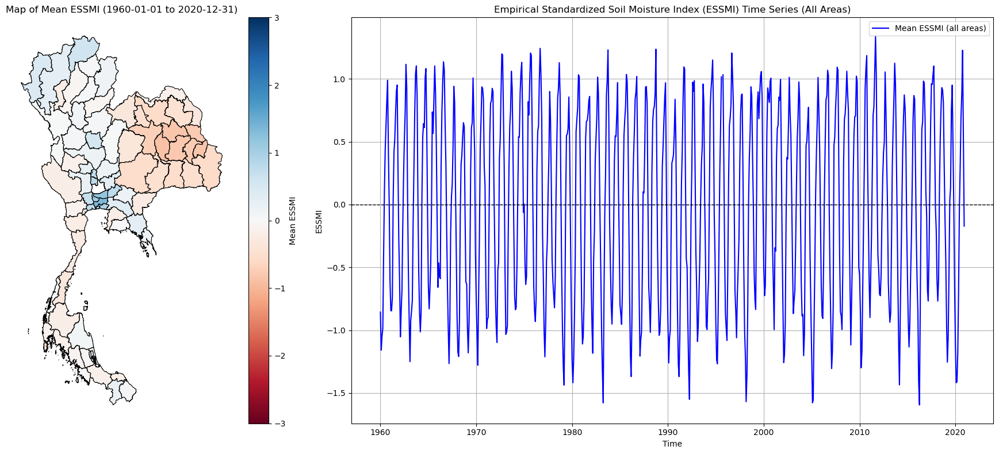

In [215]:
essmi_total = compute_essmi(dataset, var='TotalSoilMoisture', bandwidth=0.05, shapefile_gdf=gdf, time_range=['1960-01-01', '2020-12-31'], plot=True)

In [217]:
from sklearn.neighbors import KernelDensity
from scipy.stats import ks_2samp

def calculate_plot_kde_cdf(dataset, var, bandwidth=0.05, time_range=None, plot = True):
    data_Flatten = dataset[var].values.flatten()
    data_values = data_Flatten[~np.isnan(data_Flatten)]
    # Fit KDE to the soil moisture data
    kde = KernelDensity(kernel="gaussian", bandwidth=bandwidth) 
    kde.fit(data_values[:, None])
        
    # Evaluate PDF from KDE
    x_vals = np.linspace(data_values.min(), data_values.max(), 1000)
    log_pdf = kde.score_samples(x_vals[:, None])  # Log-density
    pdf = np.exp(log_pdf)
        
    # Compute the empirical CDF
    empirical_cdf = np.array([np.sum(data_values <= x) for x in x_vals]) / len(data_values)
        
    # Compute the KDE-derived CDF by integrating the PDF
    kde_cdf = np.cumsum(pdf) / np.sum(pdf)  # Normalize to get a CDF
        
    if plot:
        # Plot both CDFs
        plt.figure(figsize=(10, 6))
        plt.plot(x_vals, empirical_cdf, label="Empirical CDF", color="blue")
        plt.plot(x_vals, kde_cdf, label="KDE-derived CDF", color="orange", linestyle="--")
        plt.title("Comparison of Empirical CDF and KDE-derived CDF")
        plt.xlabel("Soil Moisture")
        plt.ylabel("Cumulative Probability")
        plt.legend()
        plt.grid(True)
        plt.show()
        
    # Perform Kolmogorov-Smirnov Test
    ks_stat, p_value = ks_2samp(empirical_cdf, kde_cdf)
    print(f"KS Statistic: {ks_stat}, p-value: {p_value}")
    # Compute RMSE
    rmse = np.sqrt(np.mean((empirical_cdf - kde_cdf) ** 2))
    print(f"RMSE between empirical CDF and KDE-derived CDF: {rmse}")

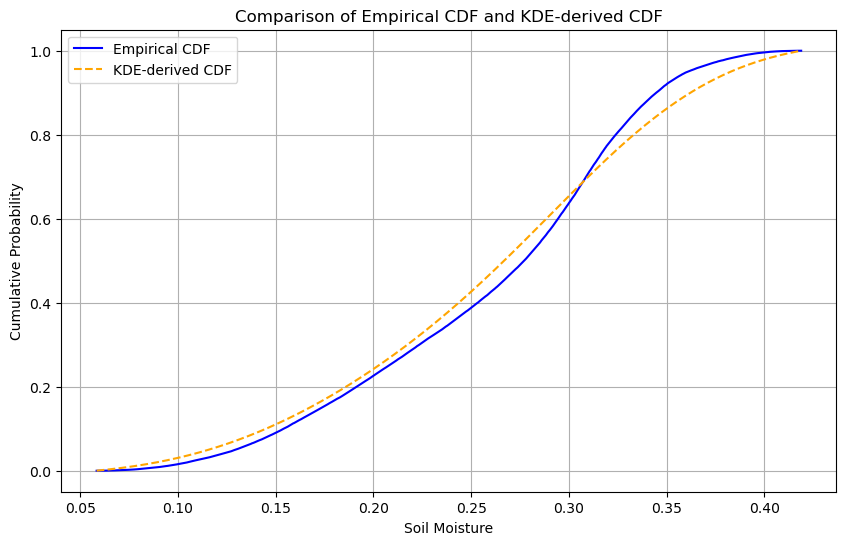

KS Statistic: 0.062, p-value: 0.042792013924212634
RMSE between empirical CDF and KDE-derived CDF: 0.029769483329681636


In [221]:
calculate_plot_kde_cdf(dataset, var='SoilMoist01', bandwidth=0.05, time_range=['1960-01-01', '2020-12-31'], plot=True)

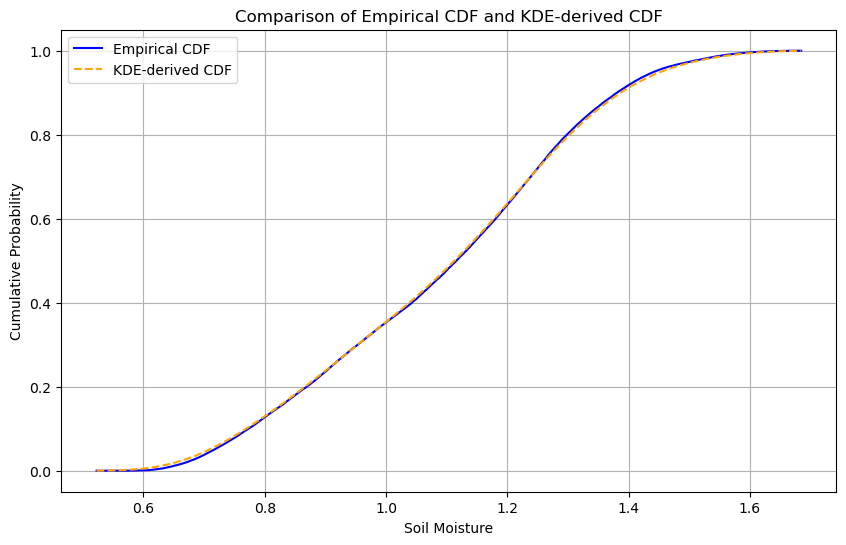

KS Statistic: 0.042, p-value: 0.34112475112661245
RMSE between empirical CDF and KDE-derived CDF: 0.004228068742215627


In [219]:
calculate_plot_kde_cdf(dataset, var='TotalSoilMoisture', bandwidth=0.05, time_range=['1960-01-01', '2020-12-31'], plot=True)

#### Compute and Visualize HSI

In [224]:
def calculate_hsi_lsm(dataset, var, T_threshold=310, shapefile_gdf=None, time_range=None, plot=True):
    """
    Compute the Heat Stress Index (HSI) using air temperature (Tair_f_tavg).

    Parameters:
    - dataset (xarray.Dataset): Dataset containing 'Tair_f_tavg' (air temperature in K).
    - T_threshold (float): Threshold temperature for heat stress (default: 310 K, approx 37°C).
    - shapefile_gdf (GeoDataFrame, optional): GeoDataFrame for spatial mapping.
    - time_range (tuple, optional): Time range for analysis (start, end). Defaults to full range.
    - plot (bool): If True, generates a map and time-series plot.

    Returns:
    - xarray.DataArray: Heat Stress Index (HSI).
    """
    # Subset the dataset to the specified time range
    if time_range:
        data = dataset.sel(time=slice(*time_range))

    # Extract air temperature (Tair_f_tavg)
    if var not in dataset:
        raise KeyError("Dataset must contain 'Tair_f_tavg' for HSI calculation.")
    Tair = data[var]

    # Compute HSI
    HSI = xr.where(Tair > T_threshold, (Tair - T_threshold) / Tair, 0)
    HSI.attrs = {
        "units": "dimensionless",
        "long_name": "Heat Stress Index",
        "description": f"HSI computed using Tair_f_tavg > {T_threshold} K"
    }

    # Plot results if requested
    if plot:
        if shapefile_gdf is None:
            raise ValueError("shapefile_gdf is required for plotting.")

        # Prepare data for the map
        mean_hsi = HSI.mean(dim="time")  # Mean HSI over time
        area_mapping = dict(zip(dataset['area'].values, mean_hsi.values))
        shapefile_gdf = shapefile_gdf.copy()
        shapefile_gdf['HSI'] = shapefile_gdf['NAME_1'].map(area_mapping)

        # Plot results
        fig, (ax_map, ax_ts) = plt.subplots(1, 2, figsize=(18, 8), gridspec_kw={'width_ratios': [1, 2]})

        # Map plot
        shapefile_gdf.plot(
            column='HSI',
            cmap='YlOrRd',
            linewidth=0.8,
            edgecolor='black',
            legend=True,
            vmin=0,
            vmax=1,
            legend_kwds={'label': 'Heat Stress Index (HSI)', 'orientation': 'vertical'},
            ax=ax_map
        )
        ax_map.set_title("Spatial Distribution of HSI")
        ax_map.axis('off')

        # Time series plot
        mean_hsi_time = HSI.mean(dim="area")
        mean_hsi_time.plot(ax=ax_ts, color='red', label='Mean HSI')
        ax_ts.axhline(0, color='black', linestyle='--', linewidth=1)
        ax_ts.set_title("Temporal Trend of HSI")
        ax_ts.set_xlabel("Time")
        ax_ts.set_ylabel("HSI Value")
        ax_ts.legend(loc='upper left')
        ax_ts.grid(True)

        plt.tight_layout()
        plt.show()

    return HSI

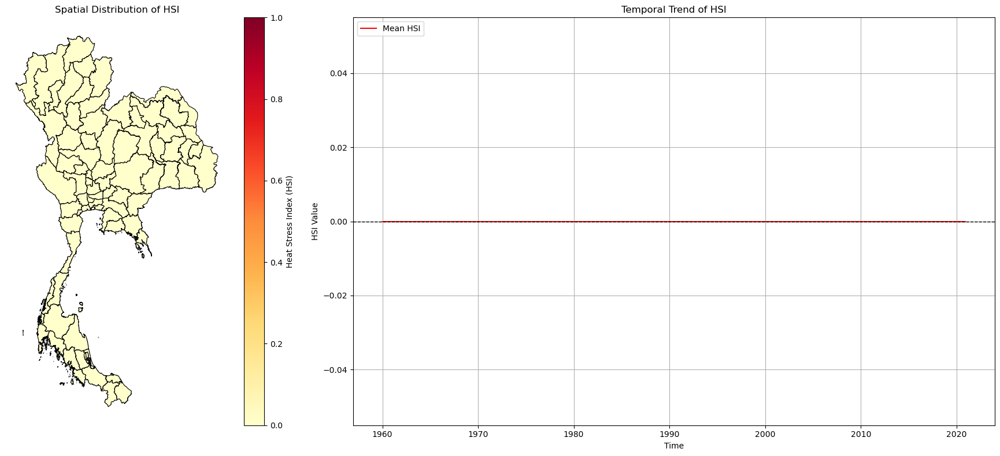

In [226]:
hsi = calculate_hsi_lsm(dataset, var = 'Tair_f', T_threshold=310, shapefile_gdf=gdf, time_range=['1960-01-01', '2020-12-31'], plot=True)

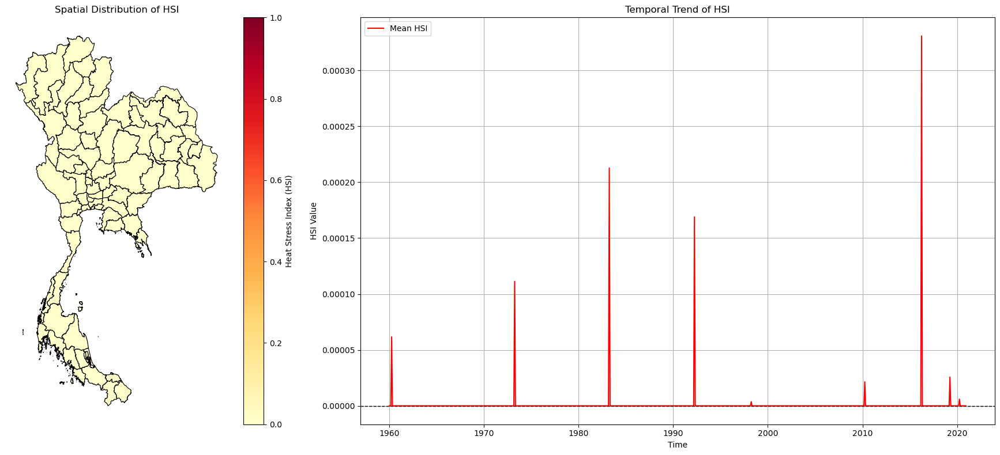

In [232]:
hsi_surfaceT = calculate_hsi_lsm(dataset, var = 'AvgSurfT', T_threshold=310, shapefile_gdf=gdf, time_range=['1960-01-01', '2020-12-31'], plot=True)

#### Compute and Visualize EWSI

In [235]:
def calculate_ewsi_from_soil_moisture_and_runoff(dataset, thresholds=None, shapefile_gdf=None, time_range=None, plot=True):
    """
    Compute the Excess Water Stress Index (EWSI) using soil moisture and runoff.

    Parameters:
    - dataset (xarray.Dataset): Dataset containing 'SoilMoistXX_tavg' and 'Qs_tavg'.
    - thresholds (dict): Thresholds for variables. Default: {"SoilMoist": 0.4, "Qs": 0.005}. **(adjust based on the region or crop requirements)**
    - shapefile_gdf (GeoDataFrame, optional): GeoDataFrame for spatial mapping.
    - time_range (tuple, optional): Time range for analysis (start, end). Defaults to full range.
    - plot (bool): If True, generates a map and time-series plot.

    Returns:
    - xarray.DataArray: Excess Water Stress Index (EWSI).
    """
    # Default thresholds if none are provided
    if thresholds is None:
        thresholds = {"SoilMoist": 0.4, "Qs": 0.005}

    # Subset dataset to the specified time range
    if time_range:
        dataset = dataset.sel(time=slice(*time_range))

    # Compute average soil moisture from layers
    soil_moisture = (dataset["SoilMoist01"] + dataset["SoilMoist02"] +
                     dataset["SoilMoist03"] + dataset["SoilMoist04"]) / 4

    # Extract surface runoff
    runoff = dataset["Qs"]

    # Compute indices
    soil_moisture_index = xr.where(soil_moisture > thresholds["SoilMoist"],
                                   (soil_moisture - thresholds["SoilMoist"]) / soil_moisture, 0)
    runoff_index = xr.where(runoff > thresholds["Qs"],
                            (runoff - thresholds["Qs"]) / runoff, 0)

    # Compute overall EWSI (weights: 60% soil moisture, 40% runoff)
    EWSI = 0.6 * soil_moisture_index + 0.4 * runoff_index
    EWSI.attrs = {
        "units": "dimensionless",
        "long_name": "Excess Water Stress Index",
        "description": "Combined index of soil moisture and surface runoff"
    }

    # Plot results if requested
    if plot:
        if shapefile_gdf is None:
            raise ValueError("shapefile_gdf is required for plotting.")

        # Prepare data for the map
        mean_ewsi = EWSI.mean(dim="time")  # Mean EWSI over time
        area_mapping = dict(zip(dataset['area'].values, mean_ewsi.values))
        shapefile_gdf = shapefile_gdf.copy()
        shapefile_gdf['EWSI'] = shapefile_gdf['NAME_1'].map(area_mapping)

        # Plot results
        fig, (ax_map, ax_ts) = plt.subplots(1, 2, figsize=(18, 8), gridspec_kw={'width_ratios': [1, 2]})

        # Map plot
        shapefile_gdf.plot(
            column='EWSI',
            cmap='Blues',
            linewidth=0.8,
            edgecolor='black',
            legend=True,
            vmin=0,
            vmax=1,
            legend_kwds={'label': 'Excess Water Stress Index (EWSI)', 'orientation': 'vertical'},
            ax=ax_map
        )
        ax_map.set_title("Spatial Distribution of EWSI")
        ax_map.axis('off')

        # Time series plot
        mean_ewsi_time = EWSI.mean(dim="area")
        mean_ewsi_time.plot(ax=ax_ts, color='blue', label='Mean EWSI')
        ax_ts.axhline(0, color='black', linestyle='--', linewidth=1)
        ax_ts.set_title("Temporal Trend of EWSI")
        ax_ts.set_xlabel("Time")
        ax_ts.set_ylabel("EWSI Value")
        ax_ts.legend(loc='upper left')
        ax_ts.grid(True)

        plt.tight_layout()
        plt.show()

    return EWSI

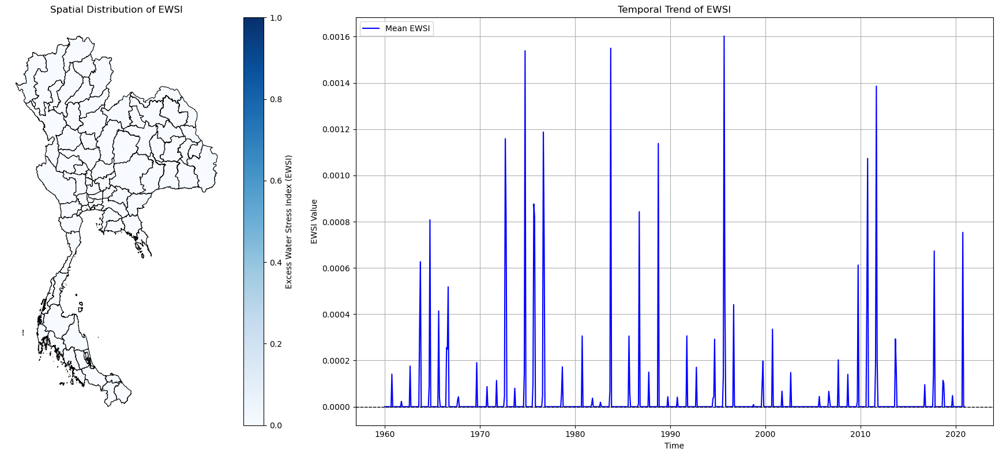

In [237]:
ewsi = calculate_ewsi_from_soil_moisture_and_runoff(dataset, thresholds=None, shapefile_gdf=gdf, 
                                                    time_range=['1960-01-01', '2020-12-31'], plot=True)

#### Drought Index (DI)

In [290]:
def calculate_simple_drought_index(dataset, shapefile_gdf=None, time_range=None, plot=True):
    """
    Compute a simple drought index using soil moisture and rainfall anomalies.

    Parameters:
    - dataset (xarray.Dataset): Dataset containing soil moisture and rainfall variables.
    - shapefile_gdf (GeoDataFrame, optional): GeoDataFrame for spatial mapping.
    - time_range (tuple, optional): Time range for analysis (start, end). Defaults to full range.
    - plot (bool): If True, generates a map and time-series plot.

    Returns:
    - xarray.DataArray: Simple Drought Index (SDI).
    """
    # Subset dataset to the specified time range
    if time_range:
        dataset = dataset.sel(time=slice(*time_range))

    # Compute average soil moisture across layers
    soil_moisture = (dataset["SoilMoist01"] + dataset["SoilMoist02"] +
                     dataset["SoilMoist03"] + dataset["SoilMoist04"]) / 4

    # Extract rainfall
    rainfall = dataset["Rainf_f"]

    # Calculate soil moisture anomaly
    soil_moisture_anomaly = (soil_moisture - soil_moisture.mean(dim="time")) / soil_moisture.std(dim="time")

    # Calculate rainfall anomaly
    rainfall_anomaly = (rainfall - rainfall.mean(dim="time")) / rainfall.std(dim="time")

    # Compute Simple Drought Index (SDI)
    SDI = (soil_moisture_anomaly + rainfall_anomaly) / 2
    SDI.attrs = {
        "units": "dimensionless",
        "long_name": "Simple Drought Index",
        "description": "Average of soil moisture anomaly and rainfall anomaly"
    }

    # Plot results if requested
    if plot:
        if shapefile_gdf is None:
            raise ValueError("shapefile_gdf is required for plotting.")

        # Prepare data for the map
        mean_sdi = SDI.mean(dim="time")  # Mean SDI over time
        #mean_sdi = np.abs(SDI).mean(dim="time")
        area_mapping = dict(zip(dataset['area'].values, mean_sdi.values))
        shapefile_gdf = shapefile_gdf.copy()
        shapefile_gdf['SDI'] = shapefile_gdf['NAME_1'].map(area_mapping)

        # Plot results
        fig, (ax_map, ax_ts) = plt.subplots(1, 2, figsize=(18, 8), gridspec_kw={'width_ratios': [1, 2]})

        # Map plot
        shapefile_gdf.plot(
            column='SDI',
            cmap='RdBu',
            linewidth=0.8,
            edgecolor='black',
            legend=True, #vmin=-1, vmax=1,
            legend_kwds={'label': 'Simple Drought Index (SDI)', 'orientation': 'vertical'},
            ax=ax_map
        )
        ax_map.set_title("Spatial Distribution of SDI")
        ax_map.axis('off')

        # Time series plot
        mean_sdi_time = SDI.mean(dim="area")
        mean_sdi_time.plot(ax=ax_ts, color='purple', label='Mean SDI')
        ax_ts.axhline(0, color='black', linestyle='--', linewidth=1)
        ax_ts.set_title("Temporal Trend of SDI")
        ax_ts.set_xlabel("Time")
        ax_ts.set_ylabel("SDI Value")
        ax_ts.legend(loc='upper left')
        ax_ts.grid(True)

        plt.tight_layout()
        plt.show()

    return SDI

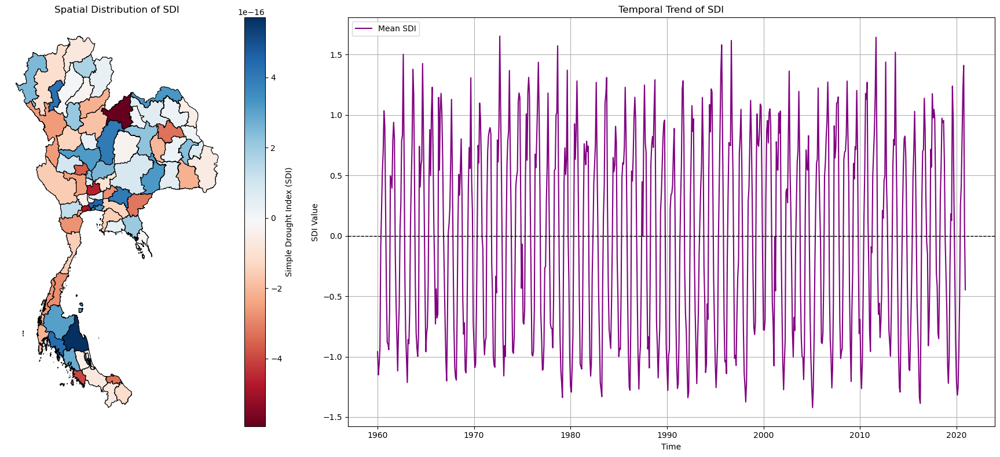

In [292]:
sdi = calculate_simple_drought_index(dataset, shapefile_gdf=gdf, 
                                     time_range=['1960-01-01', '2020-12-31'], plot=True)

In [300]:
def calculate_drought_index(dataset, weights=None, thresholds=None, shapefile_gdf=None, time_range=None, plot=True):
    """
    Compute the Drought Index (DI) using soil moisture, precipitation, and evapotranspiration.

    Parameters:
    - dataset (xarray.Dataset): Dataset containing soil moisture, rainfall, and evapotranspiration variables.
    - weights (dict): Weights for variables. Default: {"SoilMoist": 0.5, "Rainfall": 0.4, "ET": -0.1}.
    - thresholds (dict): Thresholds for classification. Default: {"mild": -0.5, "severe": -1.0}.
    - shapefile_gdf (GeoDataFrame, optional): GeoDataFrame for spatial mapping.
    - time_range (tuple, optional): Time range for analysis (start, end). Defaults to full range.
    - plot (bool): If True, generates a map and time-series plot.

    Returns:
    - xarray.DataArray: Drought Index (DI).
    """
    # Default weights if none are provided
    if weights is None:
        weights = {"SoilMoist": 0.5, "Rainfall": 0.4, "ET": -0.1}
    
    # Default thresholds for classification
    if thresholds is None:
        thresholds = {"mild": -0.5, "severe": -1.0}

    # Subset dataset to the specified time range
    if time_range:
        dataset = dataset.sel(time=slice(*time_range))

    # Compute average soil moisture from layers
    soil_moisture = (dataset["SoilMoist01"] + dataset["SoilMoist02"] +
                     dataset["SoilMoist03"] + dataset["SoilMoist04"]) / 4

    # Extract rainfall and evapotranspiration
    rainfall = dataset["Rainf_f"]
    evapotranspiration = dataset["Evap"]

    # Normalize variables (0-1 scaling)
    def normalize(var, dim="time"):
        return (var - var.min(dim=dim)) / (var.max(dim=dim) - var.min(dim=dim))

    soil_moisture_index = normalize(soil_moisture)
    rainfall_index = normalize(rainfall)
    evapotranspiration_index = normalize(evapotranspiration)

    # Compute DI
    DI = (weights["SoilMoist"] * soil_moisture_index +
          weights["Rainfall"] * rainfall_index +
          weights["ET"] * evapotranspiration_index)
    DI.attrs = {
        "units": "dimensionless",
        "long_name": "Drought Index",
        "description": "Weighted index combining soil moisture, rainfall, and evapotranspiration"
    }

    # Plot results if requested
    if plot:
        if shapefile_gdf is None:
            raise ValueError("shapefile_gdf is required for plotting.")

        # Prepare data for the map
        mean_di = DI.mean(dim="time")  # Mean DI over time
        area_mapping = dict(zip(dataset['area'].values, mean_di.values))
        shapefile_gdf = shapefile_gdf.copy()
        shapefile_gdf['DI'] = shapefile_gdf['NAME_1'].map(area_mapping)

        # Plot results
        fig, (ax_map, ax_ts) = plt.subplots(1, 2, figsize=(18, 8), gridspec_kw={'width_ratios': [1, 2]})

        # Map plot
        shapefile_gdf.plot(
            column='DI',
            cmap='YlOrBr',
            linewidth=0.8,
            edgecolor='black',
            legend=True,
            vmin=mean_di.min(),
            vmax=mean_di.max(),
            legend_kwds={'label': 'Drought Index (DI)', 'orientation': 'vertical'},
            ax=ax_map
        )
        ax_map.set_title("Spatial Distribution of DI")
        ax_map.axis('off')

        # Time series plot
        mean_di_time = DI.mean(dim="area")
        mean_di_time.plot(ax=ax_ts, color='brown', label='Mean DI')
        ax_ts.axhline(thresholds["mild"], color='orange', linestyle='--', label="Mild Drought Threshold")
        ax_ts.axhline(thresholds["severe"], color='red', linestyle='--', label="Severe Drought Threshold")
        ax_ts.set_title("Temporal Trend of DI")
        ax_ts.set_xlabel("Time")
        ax_ts.set_ylabel("DI Value")
        ax_ts.legend(loc='upper left')
        ax_ts.grid(True)

        plt.tight_layout()
        plt.show()

    return DI

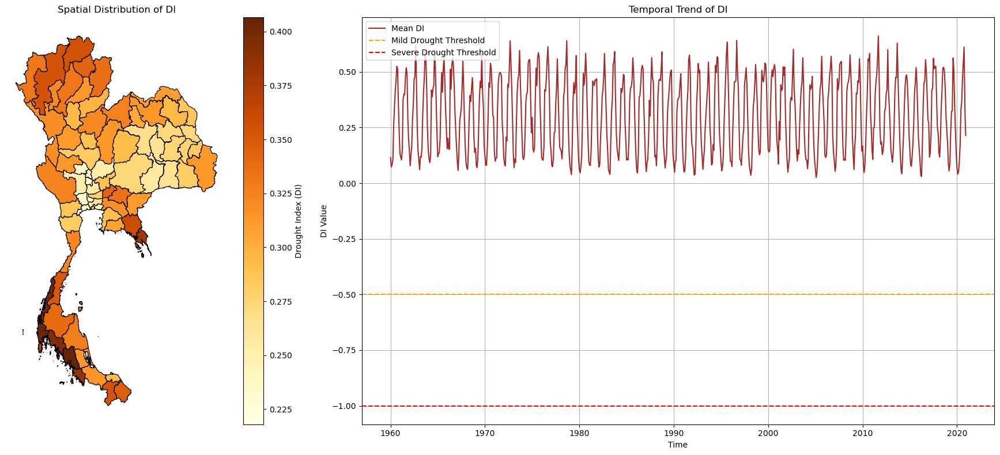

In [302]:
di = calculate_drought_index(dataset, weights=None, thresholds=None, shapefile_gdf=gdf, 
                             time_range=['1960-01-01', '2020-12-31'], plot=True)